<p align="center">
<img src="Images/sorbonne_logo.png" alt="Logo" width="300"/>
</p>

# **PANEL DATA ECONOMETRICS - Code File**

* **Author**: Elia Landini
* **Student ID**: 12310239
* **Course**: EESM2-Financial Economics 
* **Class**: Panel Data Econometrics
* **Supervisor**: Jean-Bernard Chatelain 
* **Reference Paper**: Lofaro, A., & Di Bucchianico, S. (2025). Impact of monetary policy on functional income distribution: A panel vector autoregressive analysis. Economic Modelling, 107227
* **Reference Repository**: https://github.com/EliaLand/PVAR_MonetaryPolicy_FunctionalIncome

### **0) REQUIREMENTS SET-UP**

In [152]:
# Requirements.txt file installation
# !pip install -r requirements.txt

In [153]:
# Libraries import
import warnings
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import plotly.graph_objects as go
%matplotlib inline
import seaborn as sns
import scipy.stats as stats
from scipy.stats import norm
from scipy.stats import levene
from scipy.stats import ks_2samp
from scipy.stats import kstest
from scipy.stats import pearsonr
from scipy.stats import jarque_bera
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import sklearn.tree
import sklearn.metrics
import sklearn.metrics
import sklearn.model_selection
import sklearn.preprocessing 
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.metrics import (roc_auc_score, roc_curve, confusion_matrix,
                             precision_score, recall_score, f1_score,
                             accuracy_score, precision_recall_curve, auc, 
                             RocCurveDisplay, ConfusionMatrixDisplay)
from sklearn.linear_model import (LinearRegression, LogisticRegression)
from sklearn.calibration import calibration_curve, CalibratedClassifierCV
from sklearn.utils.class_weight import compute_class_weight
import plotly.express as px
import openpyxl as pxl
from stargazer.stargazer import Stargazer
from IPython.core.display import HTML
from IPython.display import Image
import itertools
from imblearn.over_sampling import SMOTE
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Dense, Dropout
from scikeras.wrappers import KerasClassifier
from ann_visualizer.visualize import ann_viz
from collections import Counter
import shap

In [154]:
# Statistical Significance labelling 
def significance_stars(p):
    if p < 0.001:
        return "***"  
    elif p < 0.01:
        return "**"    
    elif p < 0.05:
        return "*"   
    else:
        return ""

In [155]:
# We supress potential warnings with this command
warnings.filterwarnings("ignore")

### **1) PART 1 - DATASET, UNIVARIATE & BIVARIATE DESCRIPTIVE STATISTICS AFTER TRANSFORMATIONS**

##### <span style="color: dodgerblue"> **1.1) In your data set, which are the variables which are varying with respect to two indices (or more) if you consider inflows and outflows from one individual or country to another individual or countries? Which are the variables which are varying only with respect to time? Which are the variables which are varying only with respect to individuals?** </span>

In [156]:
# Data loading 
# Data source: https://data.mendeley.com/datasets/dbfjwwwzgf/1 

raw_df = pd.read_excel("Data/Dataset_MP_Impact_functional_Distribution.xlsx")

# Transfor year in datetime format 
# (!!!) With this we avoid to include the year column as a numeric column in the descriptive statistics computations
raw_df["year"] = pd.to_datetime(raw_df["year"], format="%Y")

raw_df

,year,country,i,P,W,WR,GDP,LS,PCOM,UN,SHORTUN,LONGUN,LF,REER,SH
0,1970-01-01,Australia,7.108333,9.1,6.413648,76.120158,2.835193e+05,59.7,2.113115,1.653364,NaN,NaN,5478.225,93.904724,7.108333
1,1971-01-01,Australia,7.008333,9.6,6.909308,77.071751,2.946057e+05,60.4,2.709369,1.907799,NaN,NaN,5622.972,97.030332,7.008333
2,1972-01-01,Australia,5.083333,10.2,7.284607,75.808223,3.023225e+05,60.3,2.925285,2.610752,NaN,NaN,5750.258,98.243273,5.083333
3,1973-01-01,Australia,6.983333,11.1,8.096658,74.465333,3.147389e+05,60.8,4.174010,2.309362,NaN,NaN,5899.899,109.985873,6.983333
4,1974-01-01,Australia,13.158333,12.9,9.688749,75.817692,3.189447e+05,66.9,13.802962,2.670259,NaN,NaN,6052.784,111.086199,13.158333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,2015-01-01,USA,0.226667,100.0,65.600000,62.655205,1.820602e+07,56.8,66.099106,5.279920,5968.333,2328.0,157129.900,115.215974,-1.142704
746,2016-01-01,USA,0.644167,101.3,66.400000,62.819300,1.850960e+07,56.8,56.023884,4.869110,5746.000,2005.0,159187.200,118.668129,0.462412
747,2017-01-01,USA,1.152500,103.4,68.600000,63.695450,1.892457e+07,56.9,69.357989,4.355201,5294.250,1688.0,160319.800,118.325019,0.956409
748,2018-01-01,USA,2.188333,105.9,70.900000,64.279238,1.948198e+07,56.8,89.358138,3.895676,4964.917,1349.0,162075.000,117.086340,1.940361


In [157]:
# Df Symbols Legend 
# Following Table 1 ("Variable Definitions") in Lofaro & Bucchianico (2025)

labels_mapper = {
    "year" : "Year",
    "country" : "Country", 
    "i" : "Short-Term Interest Rate", 
    "P" : "GDP Deflator", 
    "W" : "Nominal Compensation Per Employee", 
    "WR" : "Real Compensation Per Employee", 
    "GDP" : "Real Gross Domestic Product",
    "LS" : "Adjusted Labour Share",
    "PCOM" : "Energy Commodities Price Index",
    "UN" : "Unemployment Rate", 
    "SHORTUN" : "Short-Term Unemployment",
    "LONGUN" : "Long-Term Unemployment", 
    "LF" : "Labor Force",
    "REER" : "Real Effective Exchange Rate",
    "SH" : "Shadow Interest Rate"
}

In [158]:
# Descriptive data
# Total dataset statistics
    
raw_df.describe()

,year,i,P,W,WR,GDP,LS,PCOM,UN,SHORTUN,LONGUN,LF,REER,SH
count,750,750.000000,750.000000,740.000000,740.000000,7.500000e+02,740.000000,750.000000,741.000000,588.000000,588.000000,741.000000,750.000000,750.000000
mean,1994-07-02 12:00:00,6.186977,64.343733,29.663542,49.244036,1.941396e+06,58.345405,47.449644,7.090870,1093.540056,822.288778,25015.810665,97.542743,5.709472
min,1970-01-01 00:00:00,-0.695000,1.700000,3.045484,13.615376,7.833901e+04,43.200000,2.113115,0.554685,36.500000,10.600000,1509.000000,64.192610,-6.956319
25%,1982-01-01 00:00:00,2.185590,40.550000,16.499738,38.634013,3.137606e+05,55.200000,22.325814,4.557832,163.868042,187.013999,4610.000000,90.770763,2.105984
50%,1994-07-02 12:00:00,5.315000,69.250000,28.064481,45.779160,8.989052e+05,58.300000,35.596160,6.776669,696.987875,396.700000,13526.010000,97.000461,5.267943
75%,2007-01-01 00:00:00,9.508333,90.475000,42.012400,54.778060,2.221882e+06,61.600000,69.357989,8.736210,1063.156250,1333.500000,27708.250000,101.753458,9.508333
max,2019-01-01 00:00:00,24.900000,110.800000,75.107968,193.613088,1.992897e+07,88.400000,135.215071,26.093716,9770.580000,6416.000000,163538.700000,160.023520,24.900000
std,NaN,4.846420,29.535459,16.237418,19.889039,3.088414e+06,5.415204,36.721151,3.961598,1685.300608,881.931090,32929.409955,12.833124,5.545043


In [159]:
# Descriptive data
# Single country statistics 
    
for country, df in raw_df.groupby("country"):
# We are interest only in numeric data 
    df = df.select_dtypes(include="number")
    print(f"\n=== {country} ===")
    print(df.describe())


=== Australia ===
               i           P          W         WR           GDP         LS  \
count  50.000000   50.000000  50.000000  50.000000  5.000000e+01  50.000000   
mean    7.739117   57.008000  29.756793  59.209667  6.611638e+05  58.062000   
std     4.416389   30.353656  15.048319   7.710353  2.934876e+05   4.013238   
min     1.344167    9.100000   6.413648  47.007258  2.835193e+05  52.300000   
25%     4.896667   30.550000  18.276142  54.178082  3.937023e+05  54.600000   
50%     6.566667   59.050000  28.264109  57.581440  5.860922e+05  57.850000   
75%    10.222500   81.225000  42.132904  62.012984  9.116328e+05  60.475000   
max    17.611667  106.900000  55.305034  77.071751  1.209289e+06  66.900000   

             PCOM         UN     SHORTUN      LONGUN           LF        REER  \
count   50.000000  50.000000   42.000000   42.000000     50.00000   50.000000   
mean    47.449644   6.250230  380.560828  253.481952   9016.64966   95.102589   
std     37.069227   2.1273

In [160]:
#/////////////////////////
# Pre-plotting adjustments
#/////////////////////////
# We deploy the mapper to change the columns name to something more suitable for graphs readibility 
plot_data = raw_df.copy()
plot_data = plot_data.rename(columns=labels_mapper)
# Index reset to date 
plot_data = plot_data.set_index("Year")
# Target countries
target_countries = ["Australia", "Germany", "Italy", "Japan", "UK", "USA"]
# Country color mapping 
country_colors = {
    "Australia": "#440154",  
    "Germany":   "#31688E",  
    "Italy":     "#35B779",  
    "Japan":     "#1F9E89",  
    "UK":        "#6DCD59",  
    "USA":       "#FDE725",  
}
plot_data

,Country,Short-Term Interest Rate,GDP Deflator,Nominal Compensation Per Employee,Real Compensation Per Employee,Real Gross Domestic Product,Adjusted Labour Share,Energy Commodities Price Index,Unemployment Rate,Short-Term Unemployment,Long-Term Unemployment,Labor Force,Real Effective Exchange Rate,Shadow Interest Rate
Year,,,,,,,,,,,,,,
1970-01-01,Australia,7.108333,9.1,6.413648,76.120158,2.835193e+05,59.7,2.113115,1.653364,NaN,NaN,5478.225,93.904724,7.108333
1971-01-01,Australia,7.008333,9.6,6.909308,77.071751,2.946057e+05,60.4,2.709369,1.907799,NaN,NaN,5622.972,97.030332,7.008333
1972-01-01,Australia,5.083333,10.2,7.284607,75.808223,3.023225e+05,60.3,2.925285,2.610752,NaN,NaN,5750.258,98.243273,5.083333
1973-01-01,Australia,6.983333,11.1,8.096658,74.465333,3.147389e+05,60.8,4.174010,2.309362,NaN,NaN,5899.899,109.985873,6.983333
1974-01-01,Australia,13.158333,12.9,9.688749,75.817692,3.189447e+05,66.9,13.802962,2.670259,NaN,NaN,6052.784,111.086199,13.158333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-01-01,USA,0.226667,100.0,65.600000,62.655205,1.820602e+07,56.8,66.099106,5.279920,5968.333,2328.0,157129.900,115.215974,-1.142704
2016-01-01,USA,0.644167,101.3,66.400000,62.819300,1.850960e+07,56.8,56.023884,4.869110,5746.000,2005.0,159187.200,118.668129,0.462412
2017-01-01,USA,1.152500,103.4,68.600000,63.695450,1.892457e+07,56.9,69.357989,4.355201,5294.250,1688.0,160319.800,118.325019,0.956409


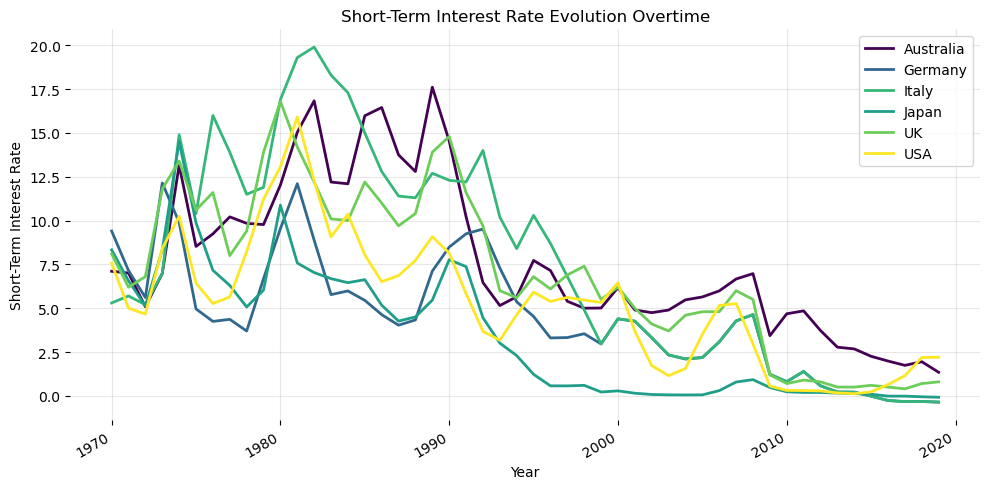

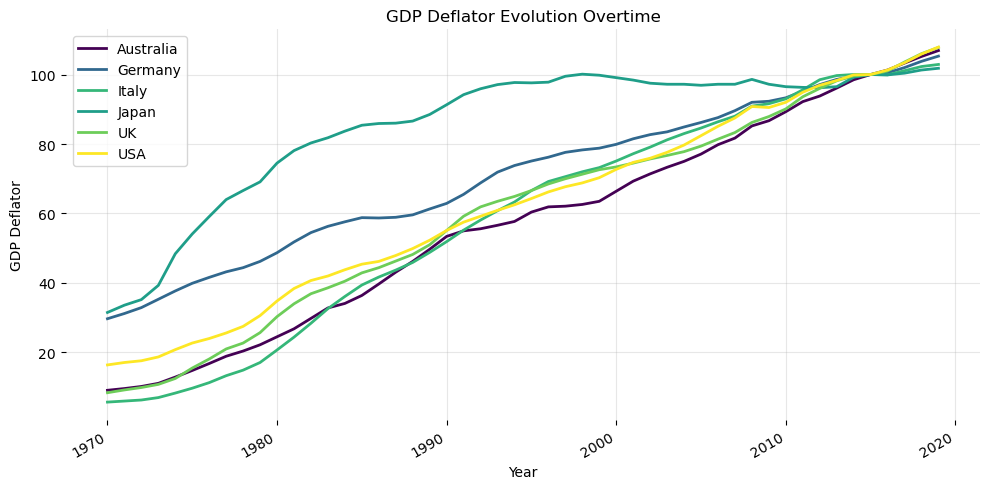

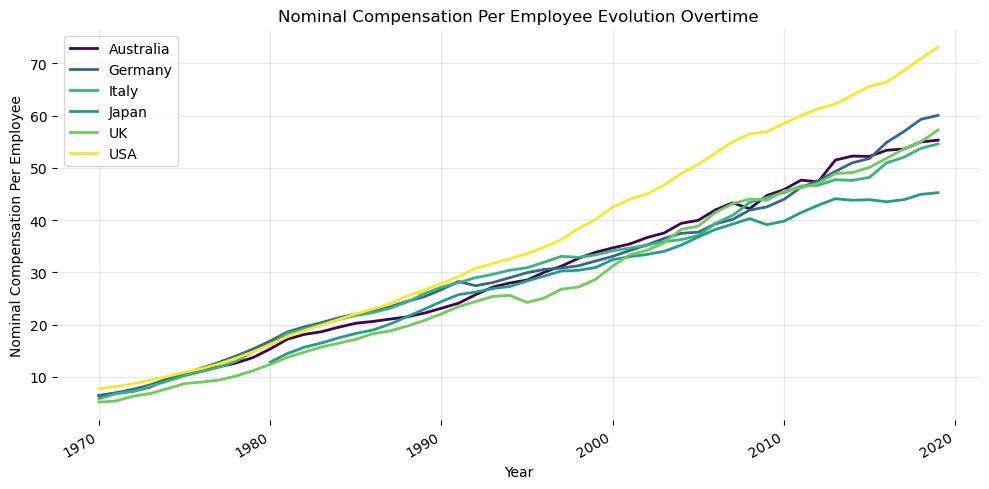

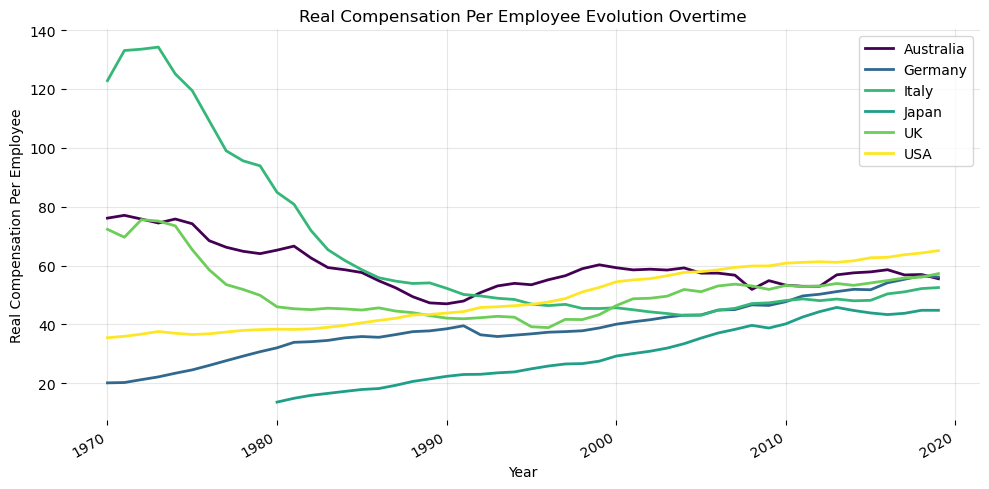

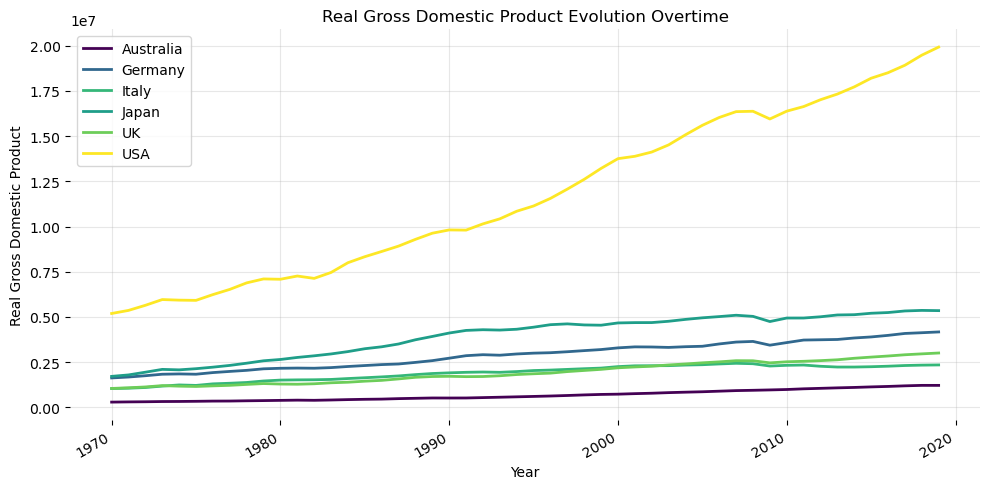

...

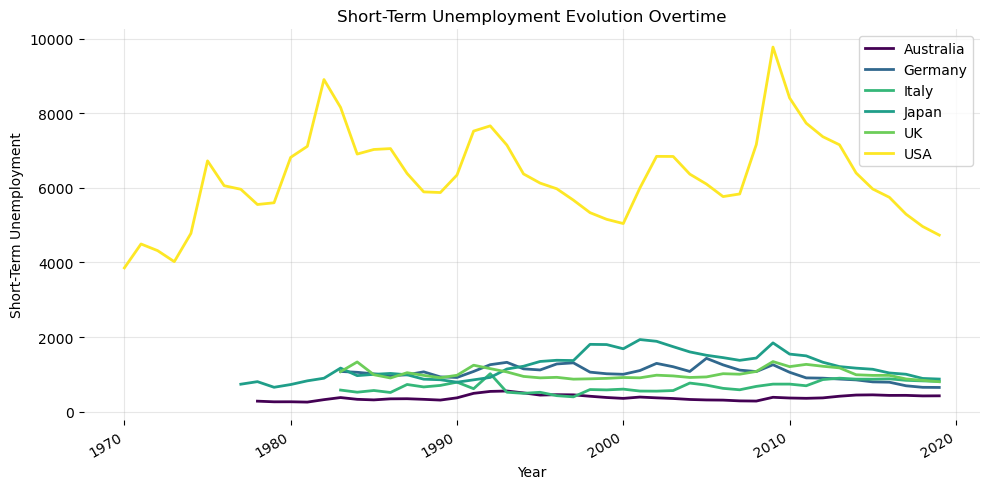

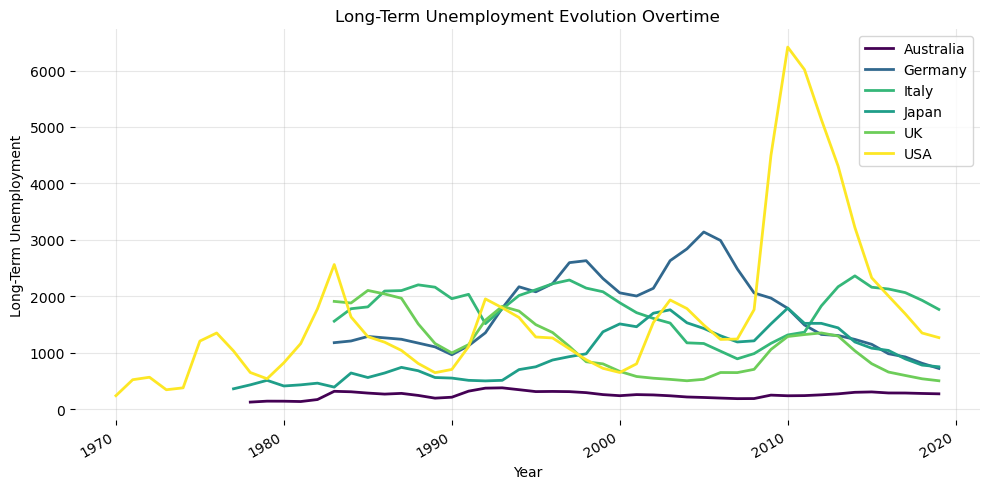

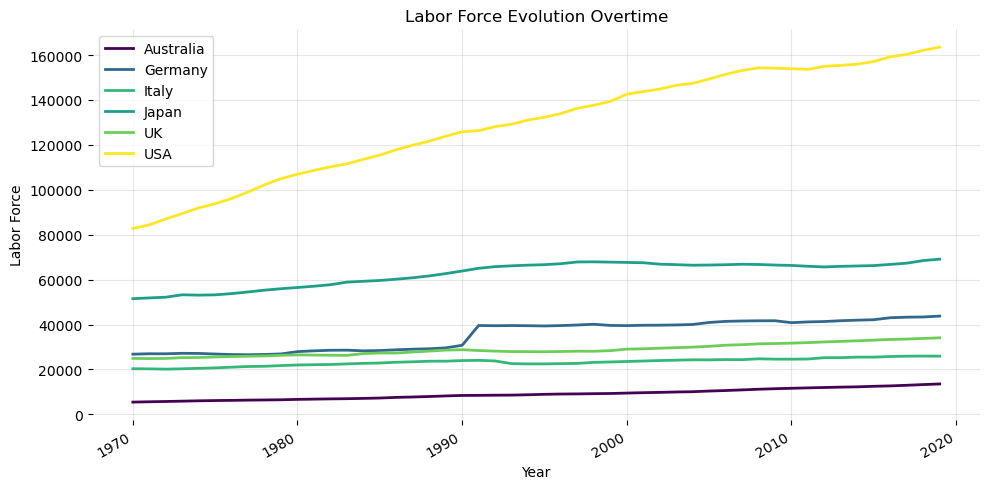

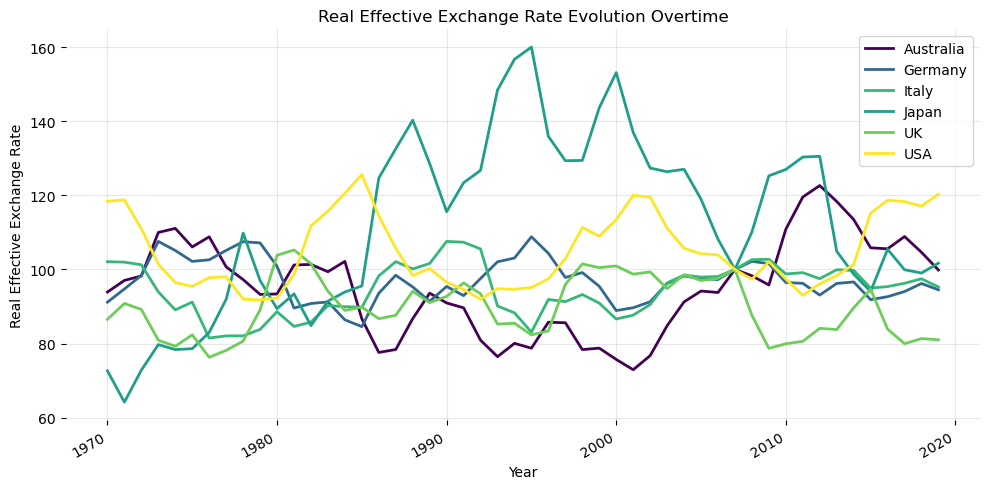

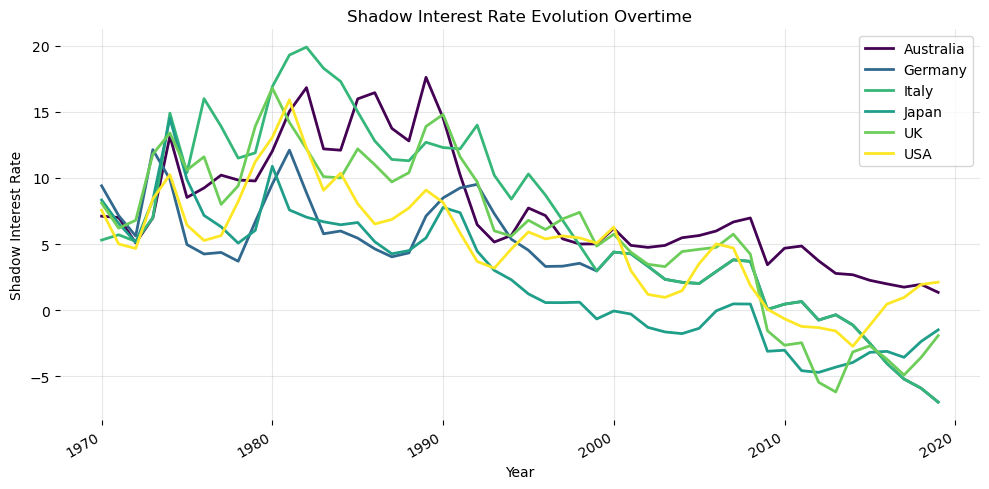

In [161]:
# Over time plotting 

#/////////
# Plotting
#/////////
# Loop on variable (without country and time)
for var in plot_data.columns: 
# (!!!) nice way to exclude country (index not var)
    if var == "Country":
        continue
# Plot set-up
    fig, ax = plt.subplots(figsize=(10, 5))
# Loop on country
# (!!!) Check countries naming
    for country in target_countries: 
        df = plot_data[plot_data["Country"].str.contains(country, na=False)]
        df = df[["Country", var]]
# (!!!) Drop nan only for those columns (var) that result affected by missing values (NOT ALL) or we will lose observations also from healthy variables
        affected_var = [
            "Nominal Compensation Per Employee", 
            "Real Compensation Per Employee", 
            "Adjusted Labour Share", 
            "Unemployment Rate", 
            "SHORTUN",
            "Long-Term Unemployment",
            "Labor Force"
        ]
        if var in affected_var:
            df = df.dropna(subset=var)
        ax.plot(
            df.index,
            df[var],
            label=country,
            linewidth=2,
            color = country_colors.get(country)
        )

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.set_title(f"{var} Evolution Overtime")
    ax.set_xlabel("Year")
    ax.set_ylabel(f"{var}")
    ax.grid(True, alpha=0.3)
    ax.legend()

    fig.autofmt_xdate()

    plt.tight_layout()
    plt.show()

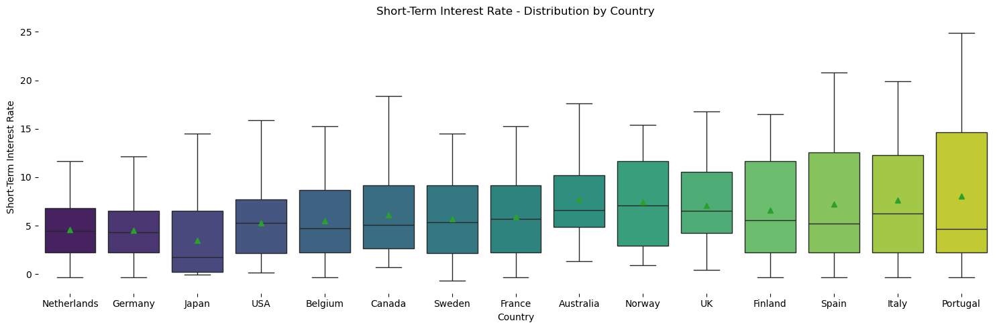

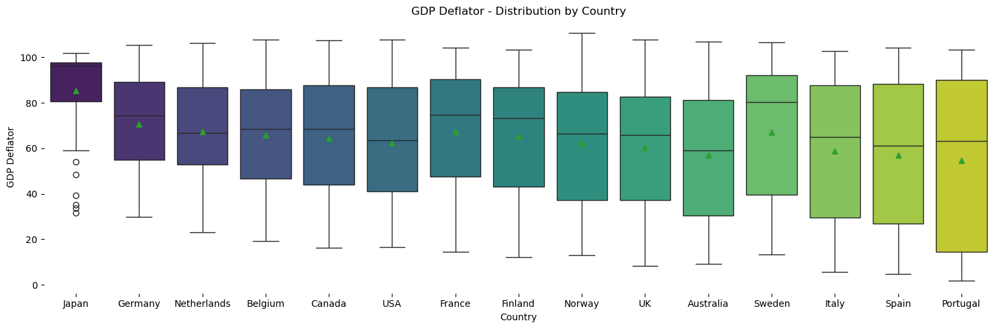

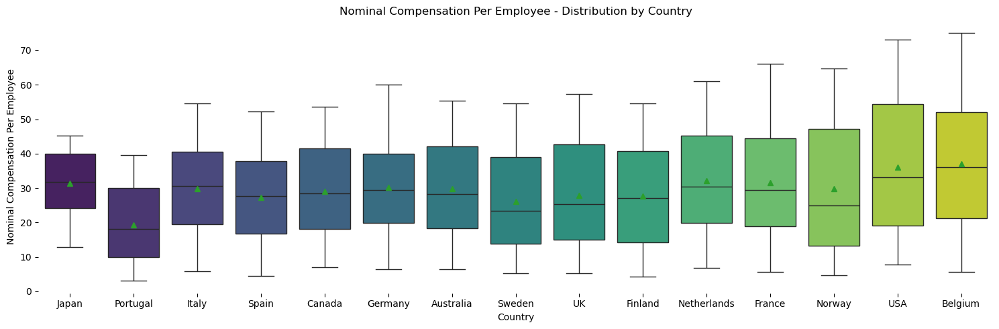

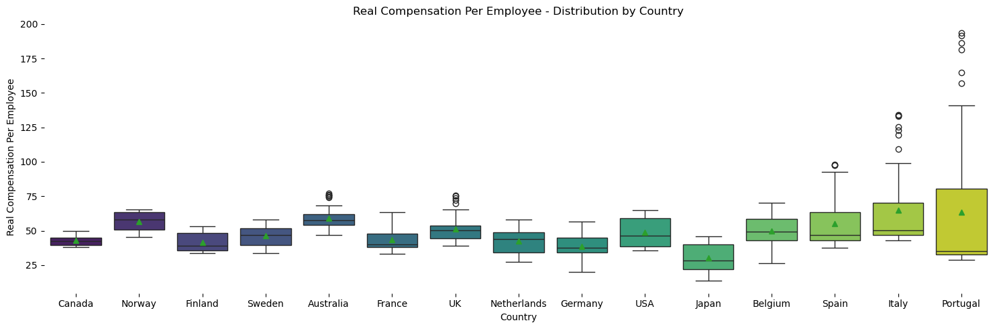

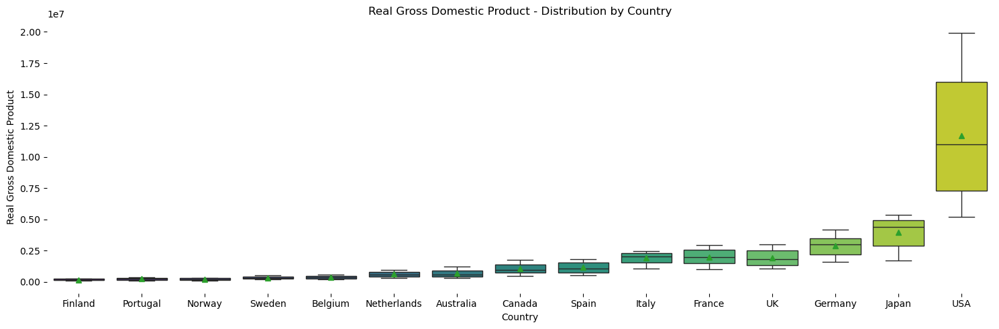

...

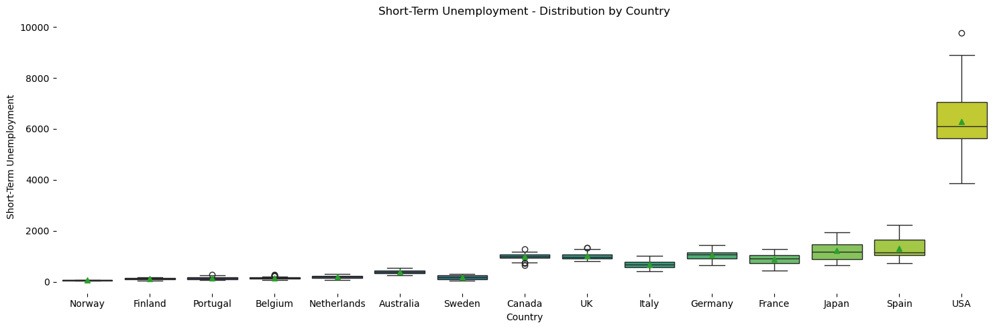

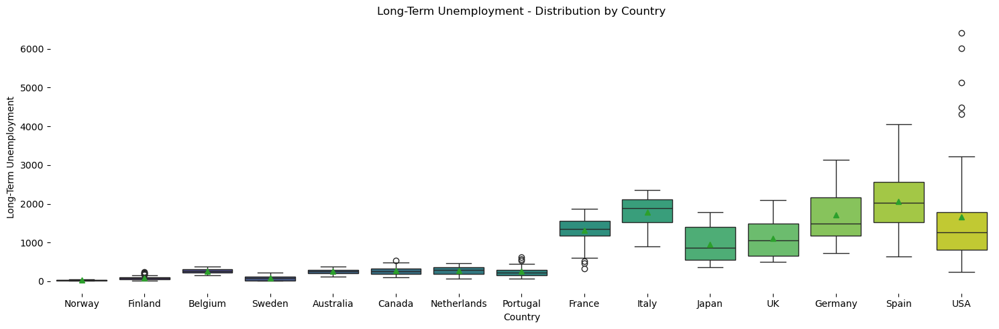

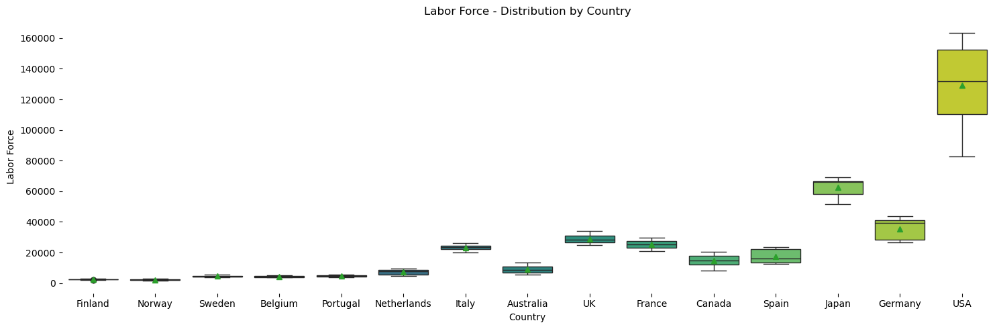

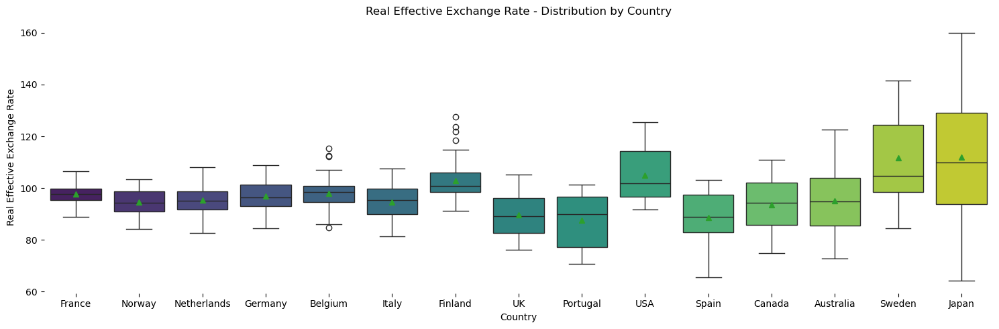

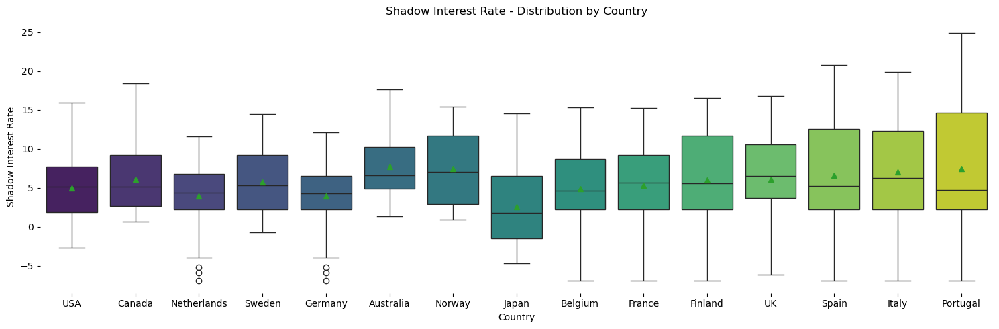

In [162]:
# Classic Variable Boxplot

#/////////
# Plotting
#/////////
# Loop on variable (without country and time)
for var in plot_data.columns: 
# (!!!) nice way to exclude country (index not var)
    if var == "Country":
        continue
# (!!!) NaN cleaning
    df = plot_data.copy()
    df = df[["Country", var]]
# (!!!) Drop nan only for those columns (var) that result affected by missing values (NOT ALL) or we will lose observations also from healthy variables
    affected_var = [
        "Nominal Compensation Per Employee", 
        "Real Compensation Per Employee", 
        "Adjusted Labour Share", 
        "Unemployment Rate", 
        "Short-Term Unemployment",
        "Long-Term Unemployment",
        "Labor Force"
    ]
    if var in affected_var:
        df = df.dropna(subset=var)
# We wanto to order countries by variance to be plugged in sns under the call "order"
# (!!!) DO not call it stats or it will clashes with the library scipy.stats
    statistics = (
        df.groupby("Country")[var]
        .agg(var="var", n="count")
        .dropna(subset=["var"])
    )
    statistics = statistics[statistics["n"] >= 2]
    if statistics.empty:
        continue
# (!!!) This is essential cuz the order must be unique (no more than one country can be associated to the same index number)
    country_order = statistics.sort_values("var").index
    country_order = pd.Index(country_order).unique().tolist()
# We define the palette following past graphs design
    pal = sns.color_palette("viridis", n_colors=len(country_order))

# Plot set-up
    fig, ax = plt.subplots(figsize=(15, 5))
    
    sns.boxplot(
        data=df,
        x="Country",
        y=var,
        showmeans=True,
        order=country_order,
        ax=ax,
        palette=pal
    )
    
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.set_title(f"{var} - Distribution by Country")
    ax.set_xlabel("Country")
    ax.set_ylabel(var)

    plt.tight_layout()
    plt.show()


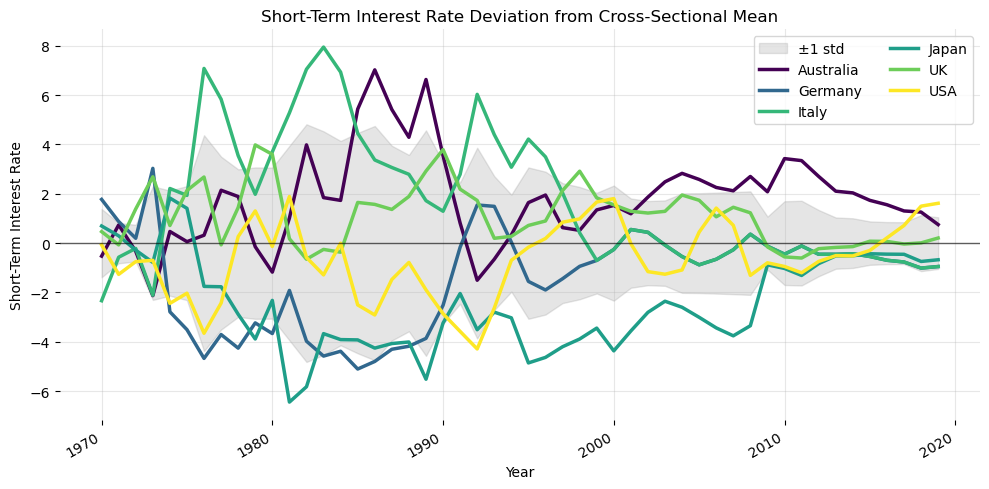

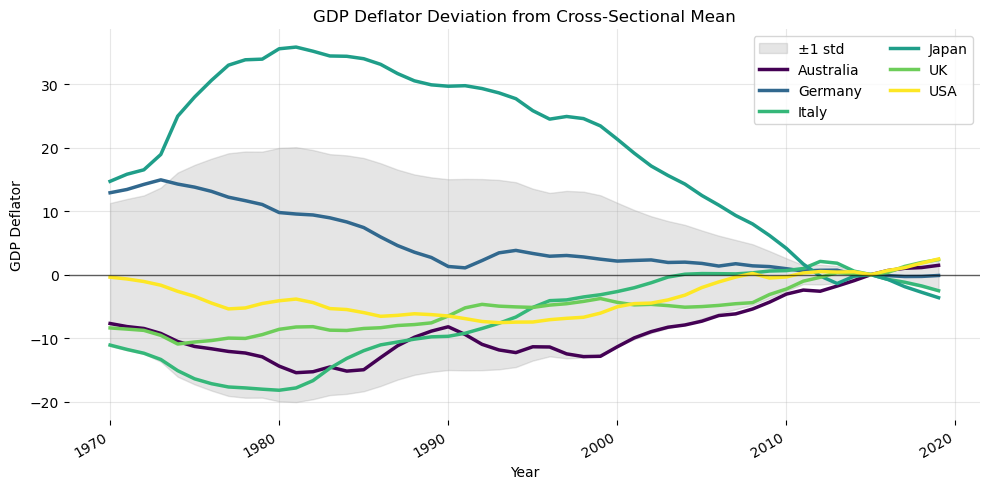

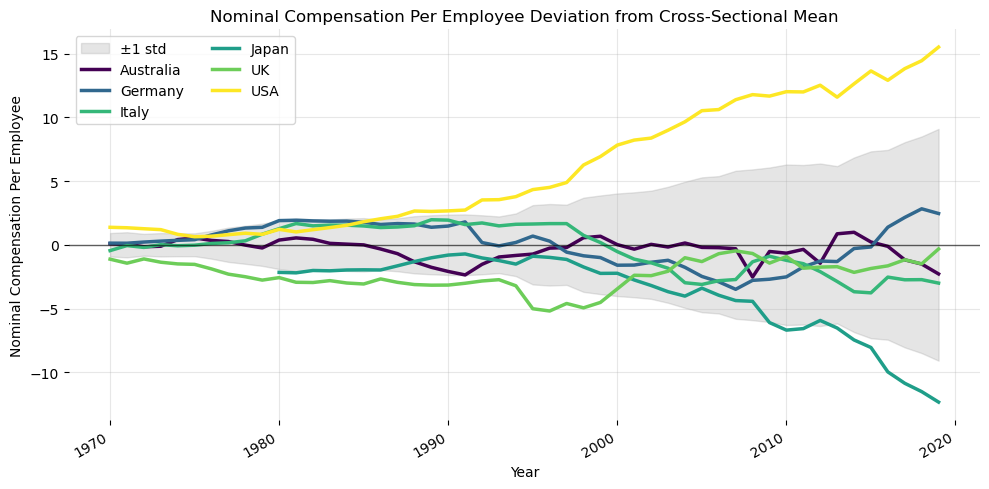

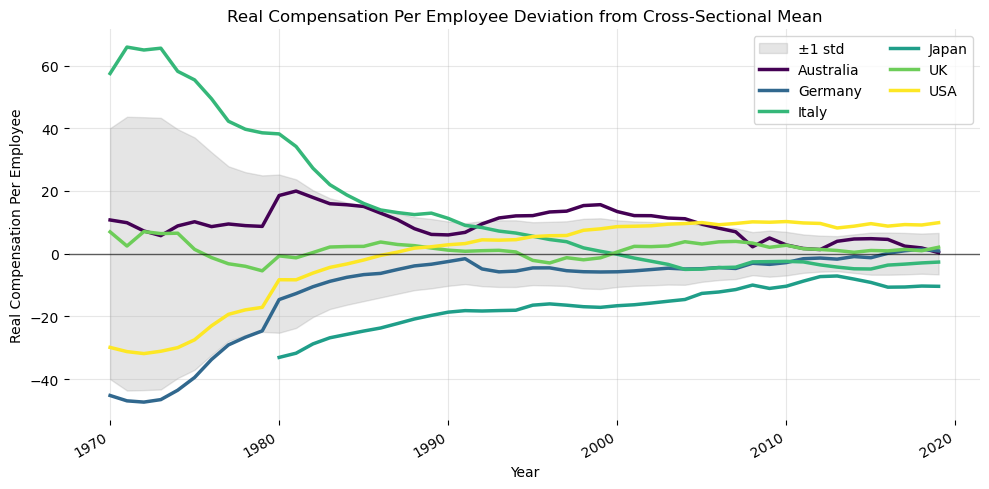

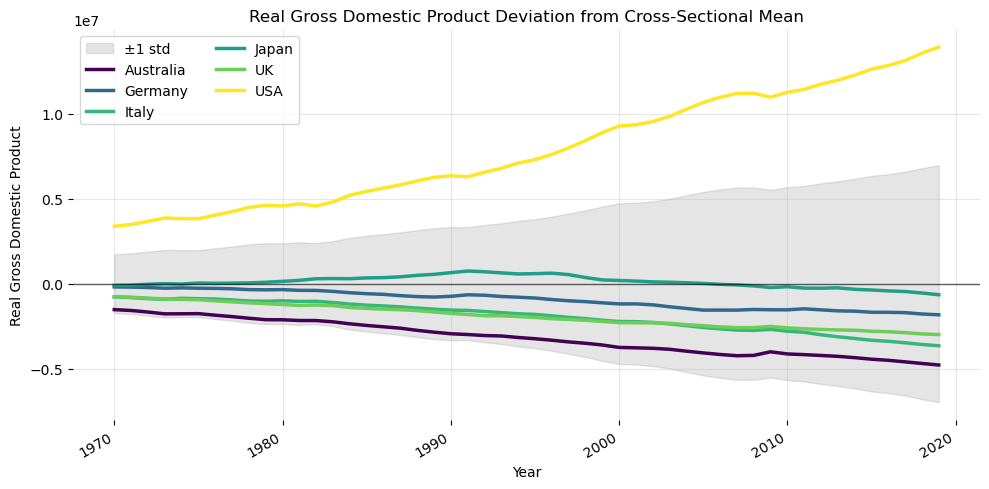

...

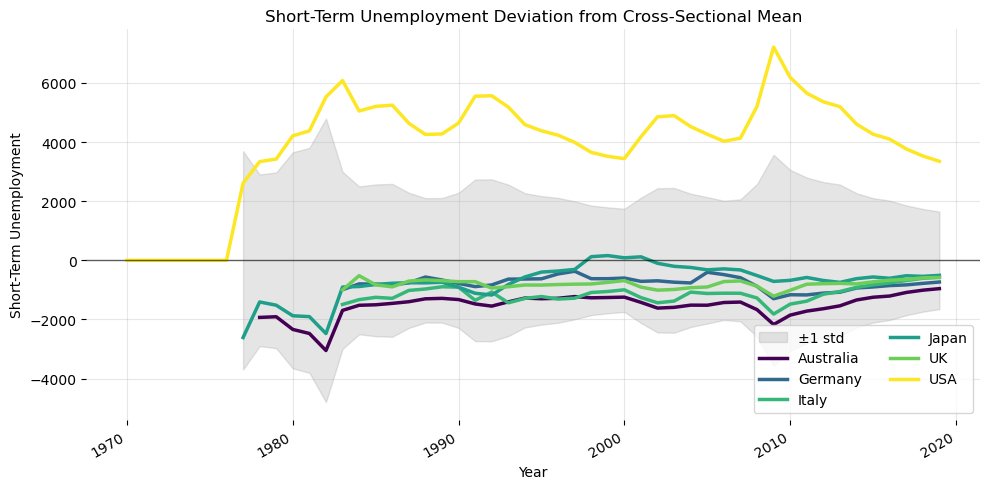

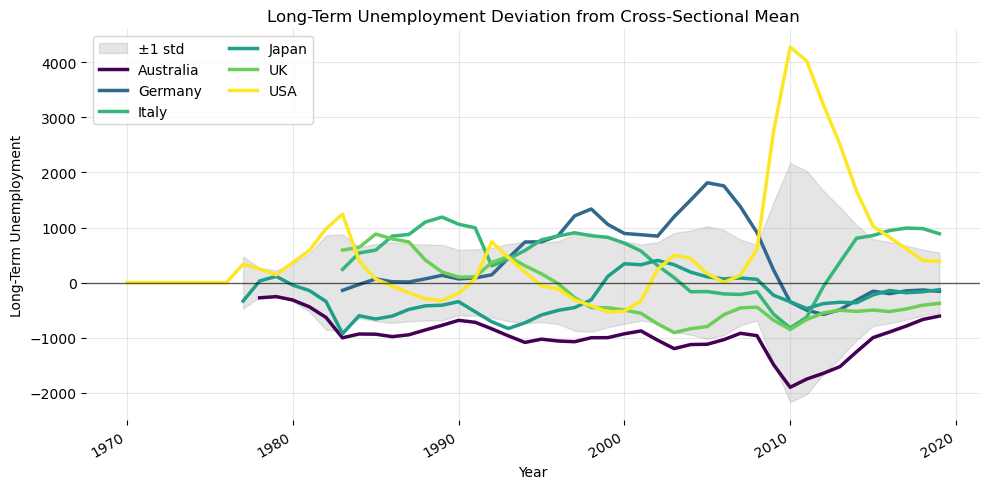

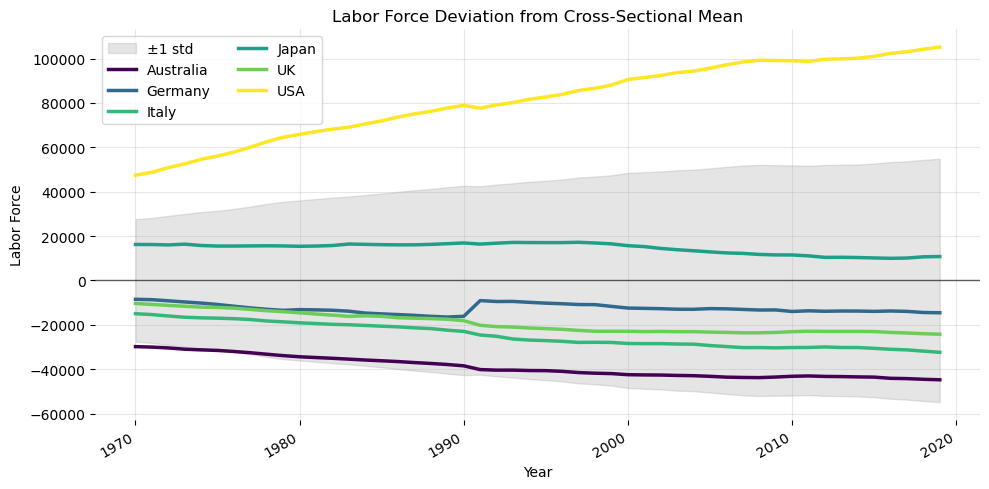

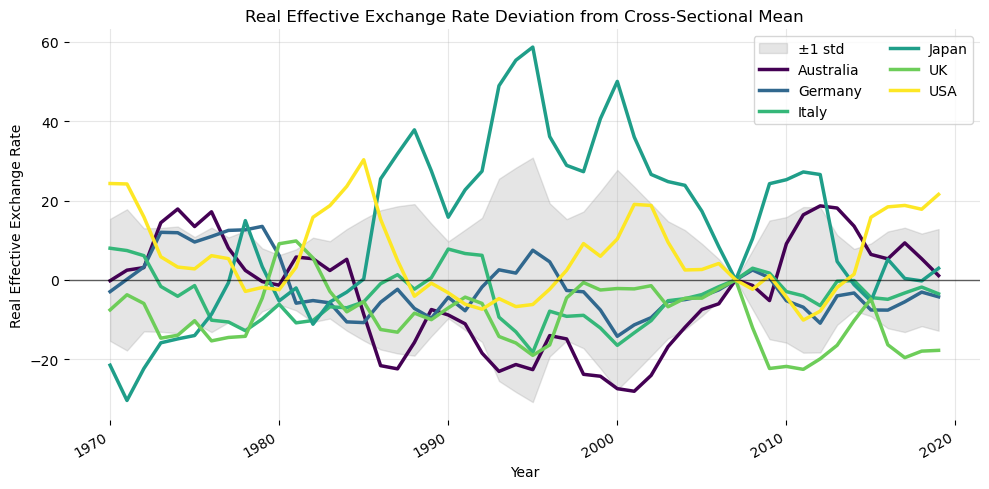

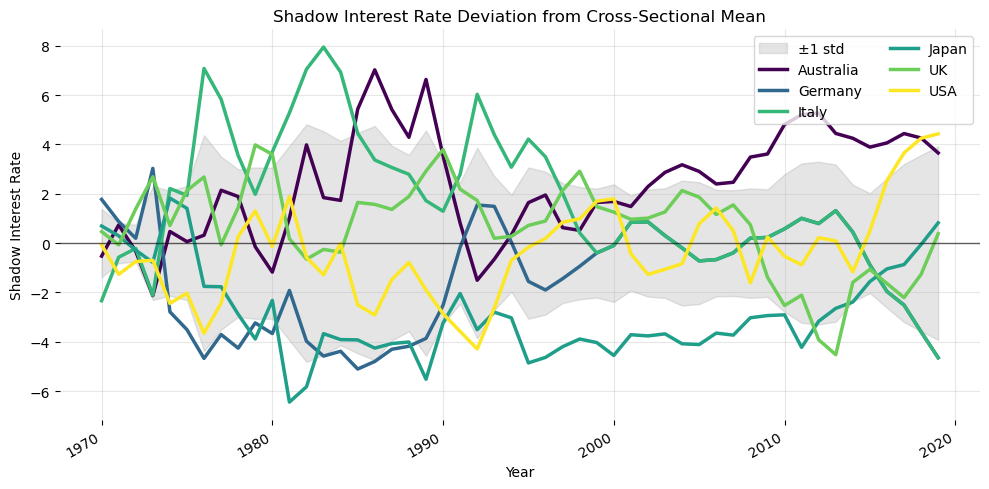

In [163]:
# Deviation from Cross-Sectional Mean plotting
# (x_it - X_t.)
# (!!!) individual invariant 

#/////////
# Plotting
#/////////
# Loop on variable (without country and time)
for var in plot_data.columns: 
# (!!!) nice way to exclude country (index not var)
    if var == "Country":
        continue
# Plot set-up
    fig, ax = plt.subplots(figsize=(10, 5))
# We create a wide panel to extract the cross-sectional mean
    sub = plot_data[plot_data["Country"].isin(target_countries)].copy()
    wide = (
        sub.pivot_table(index=sub.index, columns="Country", values=var, aggfunc="mean")
        .sort_index()
    )

    mean_t = wide.mean(axis=1)
    dev = wide.sub(mean_t, axis=0)
    std_t = dev.std(axis=1)
    ax.fill_between(
        dev.index,
        -std_t,
        std_t,
        color="grey",
        alpha=0.2,
        label="±1 std"
    )

    for country in dev.columns:
        is_highlight = country in target_countries

        ax.plot(
            dev.index,
            dev[country],
            linewidth=2.5 if is_highlight else 1.5,
            alpha=1.0 if is_highlight else 0.4,
            color=country_colors.get(country, "grey"),
            label=country if is_highlight else None
        )
    
    ax.axhline(0, color="black", linewidth=1, alpha=0.6)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.set_title(f"{var} Deviation from Cross-Sectional Mean")
    ax.set_xlabel("Year")
    ax.set_ylabel(f"{var}")
    ax.grid(True, alpha=0.3)
    ax.legend(ncol=2)

    fig.autofmt_xdate()

    plt.tight_layout()
    plt.show()

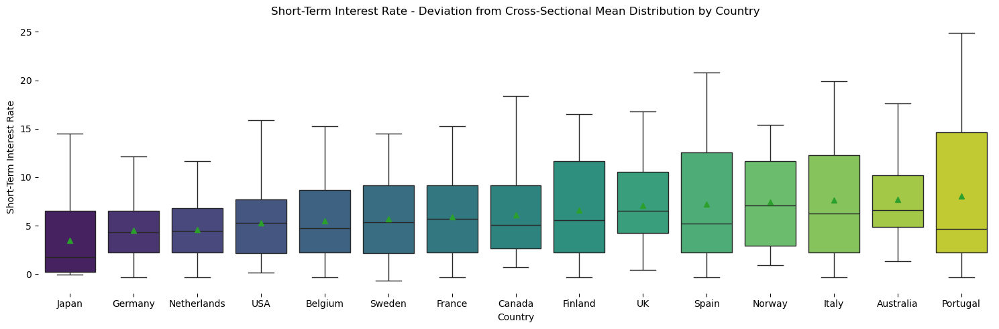

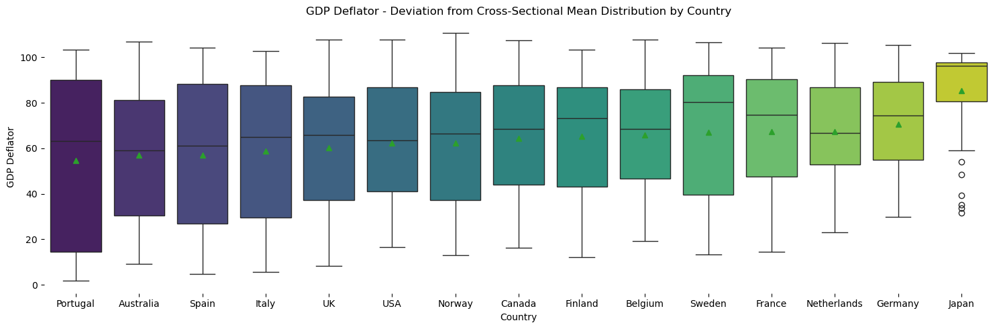

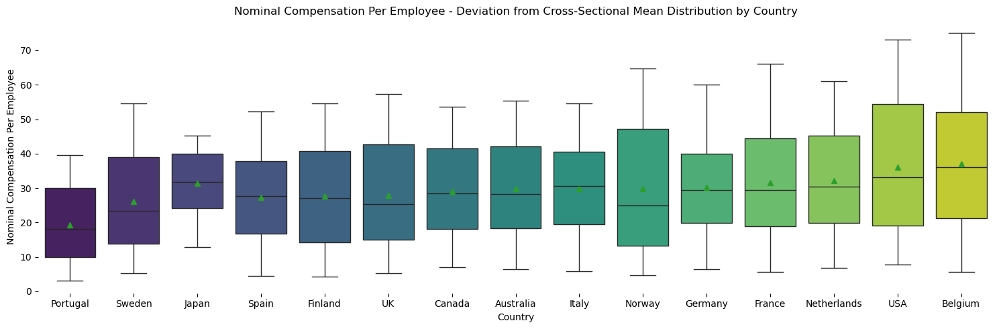

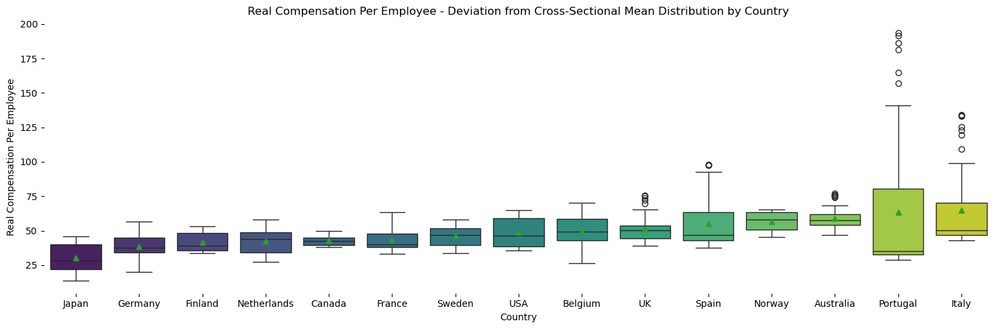

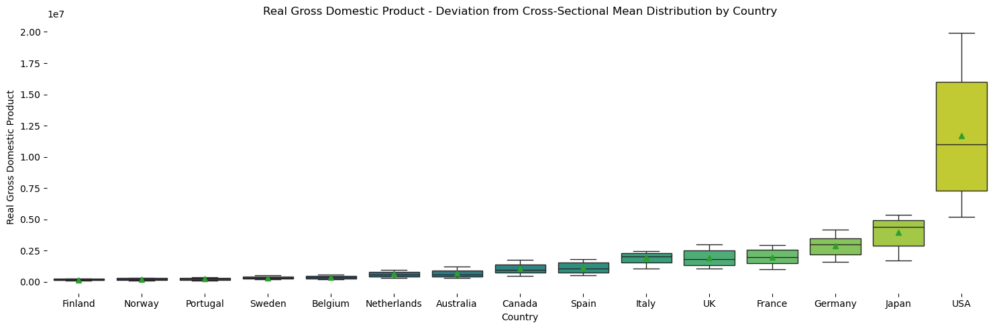

...

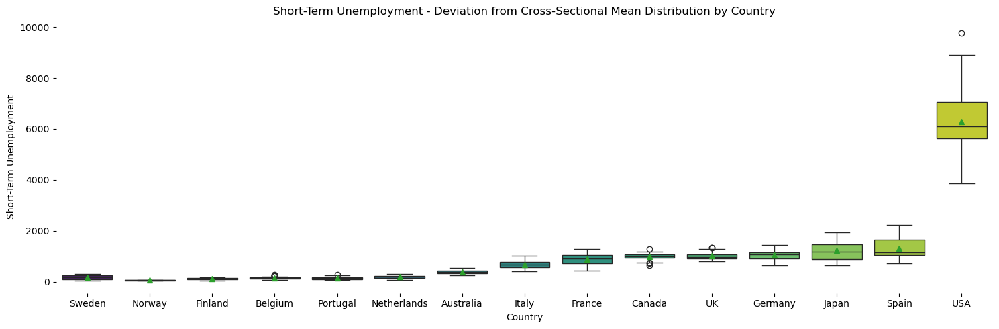

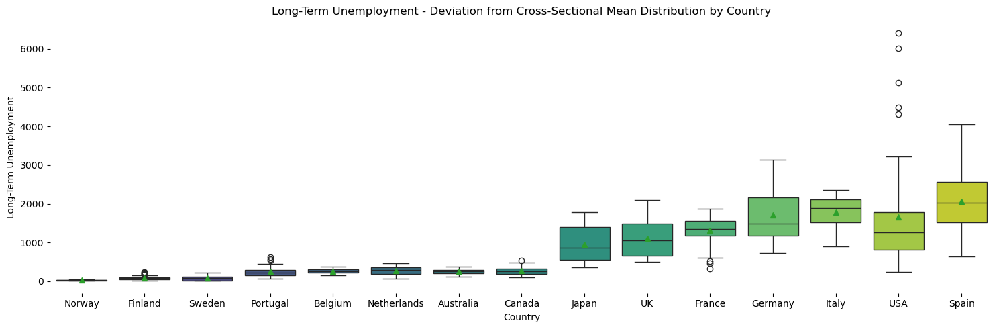

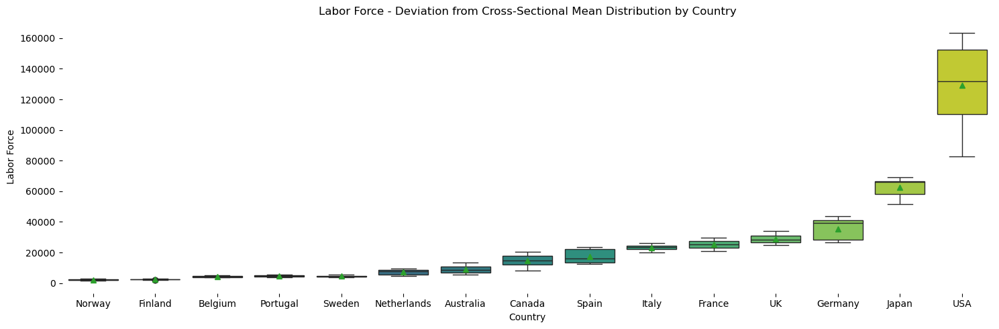

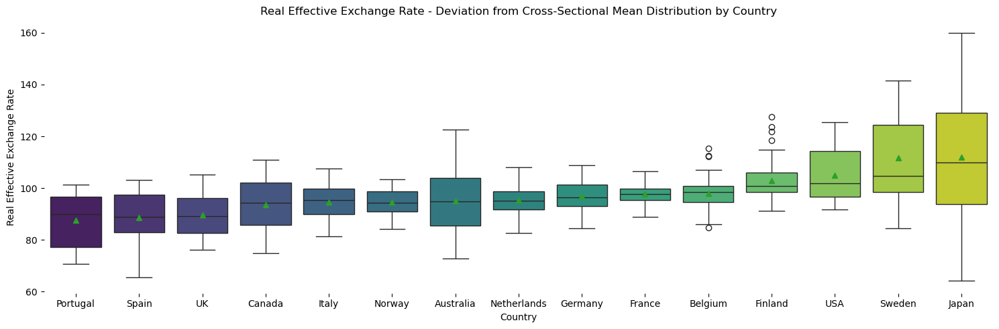

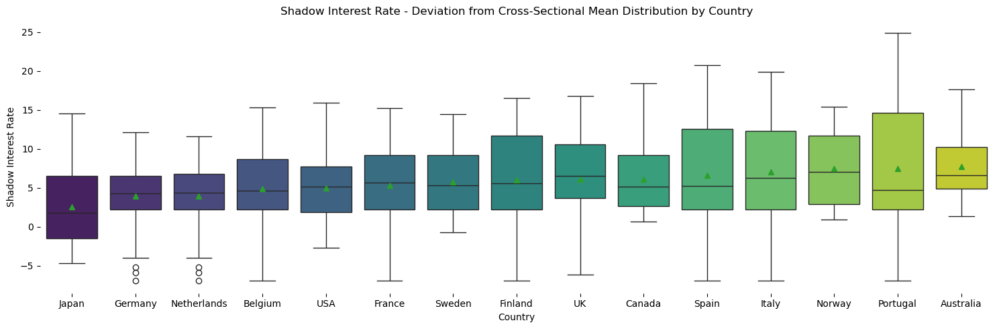

In [164]:
# Deviation from Cross-Sectional Mean Boxplot
# (!!!) the line is the median and not the mean

#/////////
# Plotting
#/////////
# Loop on variable (without country and time)
for var in plot_data.columns: 
# (!!!) nice way to exclude country (index not var)
    if var == "Country":
        continue
# (!!!) NaN cleaning
    df = plot_data.copy()
    df = df[["Country", var]]
# (!!!) Drop nan only for those columns (var) that result affected by missing values (NOT ALL) or we will lose observations also from healthy variables
    affected_var = [
        "Nominal Compensation Per Employee", 
        "Real Compensation Per Employee", 
        "Adjusted Labour Share", 
        "Unemployment Rate", 
        "Short-Term Unemployment",
        "Long-Term Unemployment",
        "Labor Force"
    ]
    if var in affected_var:
        df = df.dropna(subset=var)

# We apply again the mask
    wide = (
        df.pivot_table(index=df.index, columns="Country", values=var, aggfunc="mean")
        .sort_index()
    )
    mean_t = wide.mean(axis=1)          
    dev = wide.sub(mean_t, axis=0)     
    std_t = dev.std(axis=1)             
    df_dev = (
        dev.stack()
        .rename("dev_from_cs_mean")
        .reset_index()
        .rename(columns={"level_1": "Country"})
    )
# (!!!) We wanto to order countries by mean this time to be plugged in sns under the call "order"
    statistics = (
        df_dev.groupby("Country")["dev_from_cs_mean"]
        .agg(mean="mean", n="count")
        .dropna(subset=["mean"])
    )

    statistics = statistics[statistics["n"] >= 2]
    if statistics.empty:
        continue
# (!!!) This is essential cuz the order must be unique (no more than one country can be associated to the same index number)
    country_order = statistics.sort_values("mean").index
    country_order = pd.Index(country_order).unique().tolist()
# We define the palette following past graphs design
    pal = sns.color_palette("viridis", n_colors=len(country_order))

# Plot set-up
    fig, ax = plt.subplots(figsize=(15, 5))
    
    sns.boxplot(
        data=df,
        x="Country",
        y=var,
        order=country_order,
        showmeans=True,
        ax=ax,
        palette=pal
    )
    
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.set_title(f"{var} - Deviation from Cross-Sectional Mean Distribution by Country")
    ax.set_xlabel("Country")
    ax.set_ylabel(var)

    plt.tight_layout()
    plt.show()

##### <span style="color: dodgerblue"> **1.2) What is the largest number of period T for individuals? What is the number of individuals (countries)?** </span>

[no code, comment in the document]

##### <span style="color: dodgerblue"> **1.3) Comment on the structure of the unbalanced panel (how many (and which) countries have a single observation, discontinuities between observations, how many individuals have at least 2 consecutive observations (which is useful to compute lags, autocorrelations, first difference and within estimators)?** </span>

[no code, comment in the document]

##### <span style="color: dodgerblue"> **1.4) VARIABLE TRANSFORMATIONS PART 1: Compute between transformed and one-way-within transformed variables for all variables. Present a table with the the variance of the one-way-within-fixed-effects, between and pooled data for each variable. Compute the share of between and within variance in the total variance for each variable. Comment these results.** </span>

In [165]:
# Between Transformation 
# Key: the between transformation entails the computation of the overtime mean at the individual level for each numeric column. With this, we remove the time-variant dynamics to isolate the between-individuals variability (i). 

trans_df = raw_df.copy()

# (!!!) we are only interested in numeric cols
# (!!!) the command "columns" takes only the columns name and not the whole column (do not forget!)
numeric_cols = raw_df.select_dtypes(include="number").columns

trans_df[[f"{c}_between" for c in numeric_cols]] = (
    raw_df
    .groupby("country")[numeric_cols]
    .transform("mean")
)

trans_df

,year,country,i,P,W,WR,GDP,LS,PCOM,UN,...,WR_between,GDP_between,LS_between,PCOM_between,UN_between,SHORTUN_between,LONGUN_between,LF_between,REER_between,SH_between
0,1970-01-01,Australia,7.108333,9.1,6.413648,76.120158,2.835193e+05,59.7,2.113115,1.653364,...,59.209667,6.611638e+05,58.062,47.449644,6.250230,380.560828,253.481953,9016.64966,95.102589,7.739117
1,1971-01-01,Australia,7.008333,9.6,6.909308,77.071751,2.946057e+05,60.4,2.709369,1.907799,...,59.209667,6.611638e+05,58.062,47.449644,6.250230,380.560828,253.481953,9016.64966,95.102589,7.739117
2,1972-01-01,Australia,5.083333,10.2,7.284607,75.808223,3.023225e+05,60.3,2.925285,2.610752,...,59.209667,6.611638e+05,58.062,47.449644,6.250230,380.560828,253.481953,9016.64966,95.102589,7.739117
3,1973-01-01,Australia,6.983333,11.1,8.096658,74.465333,3.147389e+05,60.8,4.174010,2.309362,...,59.209667,6.611638e+05,58.062,47.449644,6.250230,380.560828,253.481953,9016.64966,95.102589,7.739117
4,1974-01-01,Australia,13.158333,12.9,9.688749,75.817692,3.189447e+05,66.9,13.802962,2.670259,...,59.209667,6.611638e+05,58.062,47.449644,6.250230,380.560828,253.481953,9016.64966,95.102589,7.739117
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,2015-01-01,USA,0.226667,100.0,65.600000,62.655205,1.820602e+07,56.8,66.099106,5.279920,...,48.940835,1.171694e+07,59.682,47.449644,6.202492,6285.456600,1655.700000,129297.66500,104.919930,4.988276
746,2016-01-01,USA,0.644167,101.3,66.400000,62.819300,1.850960e+07,56.8,56.023884,4.869110,...,48.940835,1.171694e+07,59.682,47.449644,6.202492,6285.456600,1655.700000,129297.66500,104.919930,4.988276
747,2017-01-01,USA,1.152500,103.4,68.600000,63.695450,1.892457e+07,56.9,69.357989,4.355201,...,48.940835,1.171694e+07,59.682,47.449644,6.202492,6285.456600,1655.700000,129297.66500,104.919930,4.988276
748,2018-01-01,USA,2.188333,105.9,70.900000,64.279238,1.948198e+07,56.8,89.358138,3.895676,...,48.940835,1.171694e+07,59.682,47.449644,6.202492,6285.456600,1655.700000,129297.66500,104.919930,4.988276


In [166]:
# One-way-within-FE Transformation 
# Key: the one-way-within transformation (demeaning) entails the computation of the difference between yit (actual value of y of i at time t) and the overtime mean at the individual level for each numeric column. 

# (!!!) we keep the reference to raw_data to avoid picking up the new columns just created from the between transformation
numeric_cols = raw_df.select_dtypes(include="number").columns

# (!!!) no need to groupby for raw_data[c] as it already cross matches with the mean of reference given the index 
for c in numeric_cols: 
    trans_df[f"{c}_within"] = raw_df[c] - raw_df.groupby("country")[c].transform("mean")

trans_df

,year,country,i,P,W,WR,GDP,LS,PCOM,UN,...,WR_within,GDP_within,LS_within,PCOM_within,UN_within,SHORTUN_within,LONGUN_within,LF_within,REER_within,SH_within
0,1970-01-01,Australia,7.108333,9.1,6.413648,76.120158,2.835193e+05,59.7,2.113115,1.653364,...,16.910491,-3.776445e+05,1.638,-45.336529,-4.596866,NaN,NaN,-3538.42466,-1.197865,-0.630783
1,1971-01-01,Australia,7.008333,9.6,6.909308,77.071751,2.946057e+05,60.4,2.709369,1.907799,...,17.862084,-3.665581e+05,2.338,-44.740274,-4.342431,NaN,NaN,-3393.67766,1.927743,-0.730783
2,1972-01-01,Australia,5.083333,10.2,7.284607,75.808223,3.023225e+05,60.3,2.925285,2.610752,...,16.598556,-3.588412e+05,2.238,-44.524359,-3.639478,NaN,NaN,-3266.39166,3.140684,-2.655783
3,1973-01-01,Australia,6.983333,11.1,8.096658,74.465333,3.147389e+05,60.8,4.174010,2.309362,...,15.255666,-3.464249e+05,2.738,-43.275634,-3.940869,NaN,NaN,-3116.75066,14.883284,-0.755783
4,1974-01-01,Australia,13.158333,12.9,9.688749,75.817692,3.189447e+05,66.9,13.802962,2.670259,...,16.608025,-3.422190e+05,8.838,-33.646681,-3.579972,NaN,NaN,-2963.86566,15.983610,5.419217
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,2015-01-01,USA,0.226667,100.0,65.600000,62.655205,1.820602e+07,56.8,66.099106,5.279920,...,13.714370,6.489088e+06,-2.882,18.649462,-0.922572,-317.1236,672.3,27832.23500,10.296044,-6.130979
746,2016-01-01,USA,0.644167,101.3,66.400000,62.819300,1.850960e+07,56.8,56.023884,4.869110,...,13.878465,6.792669e+06,-2.882,8.574240,-1.333382,-539.4566,349.3,29889.53500,13.748199,-4.525864
747,2017-01-01,USA,1.152500,103.4,68.600000,63.695450,1.892457e+07,56.9,69.357989,4.355201,...,14.754615,7.207639e+06,-2.782,21.908346,-1.847291,-991.2066,32.3,31022.13500,13.405089,-4.031867
748,2018-01-01,USA,2.188333,105.9,70.900000,64.279238,1.948198e+07,56.8,89.358138,3.895676,...,15.338404,7.765040e+06,-2.882,41.908495,-2.306816,-1320.5396,-306.7,32777.33500,12.166410,-3.047915


In [167]:
# Variance Analysis

#____________________________________________________________________________________
# Pooled data Variance 
# Var_pooled = Var(x_it)
# (!!!) if balanced Var(x_it) = Var_between + Var_within = Var(x_i.) + Var(x_it - x_i.)
# (!!!) add variance equality demonstration in the document
#____________________________________________________________________________________
# Between Variance 
# Var_between = Var(x_i.)
#____________________________________________________________________________________
# One-way-within Variance
# Var_within = Var(x_it - x_i.)
#____________________________________________________________________________________ 

df = raw_df.copy().rename(columns=labels_mapper)
numeric_cols = df.select_dtypes(include="number").columns

rows = []
for var in numeric_cols:

# 1) Pooled Variance 
    x_it = df[var]
    var_pooled = df[var].var(ddof=0)

# 2) Between Variance
    x_i = df.groupby("Country")[var].transform("mean")
    x_between = x_i
    var_between = x_between.var(ddof=0)

# 3) Within Variance (one-way FE demeaned)
    x_i = df.groupby("Country")[var].transform("mean")
    x_within = x_it - x_i
    var_within = x_within.var(ddof=0)

# Variance shares (guard against zero pooled var)
# if balanced Var(x_it) = Var_between + Var_within = Var(x_i.) + Var(x_it - x_i.)
    var_share_between = var_between / var_pooled
    var_share_within = var_within / var_pooled

    rows.append({
        "Variable": var,
        "Pooled Variance (x_it)": var_pooled,
        "Between Variance (x_i.)": var_between,
        "Within Variance (x_it - x_i.)": var_within,
        "Variance Share - Between": var_share_between,
        "Variance Share - Within": var_share_within
    })

var_table = pd.DataFrame(rows).set_index("Variable")
var_table

,Pooled Variance (x_it),Between Variance (x_i.),Within Variance (x_it - x_i.),Variance Share - Between,Variance Share - Within
Variable,,,,,
Short-Term Interest Rate,2.345647e+01,1.711280e+00,2.174519e+01,7.295557e-02,0.927044
GDP Deflator,8.711802e+02,5.136753e+01,8.198127e+02,5.896315e-02,0.941037
Nominal Compensation Per Employee,2.632974e+02,1.603596e+01,2.470830e+02,6.090436e-02,0.938418
Real Compensation Per Employee,3.950393e+02,8.661118e+01,3.121126e+02,2.192470e-01,0.790080
Real Gross Domestic Product,9.525583e+12,7.966062e+12,1.559521e+12,8.362808e-01,0.163719
Adjusted Labour Share,2.928480e+01,1.126419e+01,1.802729e+01,3.846428e-01,0.615585
Energy Commodities Price Index,1.346645e+03,6.911684e-26,1.346645e+03,5.132521e-29,1.000000
Unemployment Rate,1.567308e+01,6.969757e+00,8.624334e+00,4.446960e-01,0.550264
Short-Term Unemployment,2.835408e+06,2.201437e+06,1.527830e+05,7.764094e-01,0.053884


In [168]:
# 3D Variance Surface Plotting

# Target variable
# (!!!) In this case we go for the Unemployment Rate given its interesting balanced share ration between within and between variance
var = var_table.index[7]

#////////////////
# Axis Definition
#////////////////

# Variance call 
pooled  = float(var_table.loc[var, "Pooled Variance (x_it)"])
between = float(var_table.loc[var, "Between Variance (x_i.)"])
within  = float(var_table.loc[var, "Within Variance (x_it - x_i.)"])
# Normalized shares (geometry-safe)
between_share = float(var_table.loc[var, "Variance Share - Between"])
within_share  = float(var_table.loc[var, "Variance Share - Within"])
# Grid set-up for the surface design
n = 80
x = np.linspace(0, within, n)
y = np.linspace(0, between, n)
X, Y = np.meshgrid(x, y)
# Pooled variance surface (plane suface and wave with + 0.05)
Z = pooled * (X / within * within_share + Y / between * between_share)
# (!!!) Cos and Sin for the curvature
Z += 0.05 * pooled * np.sin(2*np.pi*X/within) * np.cos(2*np.pi*Y/between)

#/////////
# Plotting
#/////////
fig = go.Figure(go.Surface(
    x=X,
    y=Y,
    z=Z,
    colorscale="Viridis",
    showscale=True,
))
fig.update_layout(
    title=f"3D Variance Decomposition — {var}",
    scene=dict(
        xaxis=dict(title="Within variance"),
        yaxis=dict(title="Between variance"),
        zaxis=dict(title="Pooled variance"),
        aspectmode="cube",
    ),
    margin=dict(l=0, r=0, b=0, t=60),
)

fig.show()

##### <span style="color: dodgerblue"> **1.5) Plot the distribution of the one-way-fixed-effects-within x(it)-x(i.) and between (x(i.)) transformed dependent variable and of you key (preferred) explanatory variable (not all the explanatory variable) plotting on the same graph an histogram, a normal law with same empirical mean and standard error and a kernel continuous approximation. Comment the between and within difference for each variable, and compare within/within for dependent and explanatory variable, and between/between for dependent and explanatory variable: kurtosis, skewness, non-normality, high leverage observation (far from the mean), several modes (mixture of distribution)?** </span>

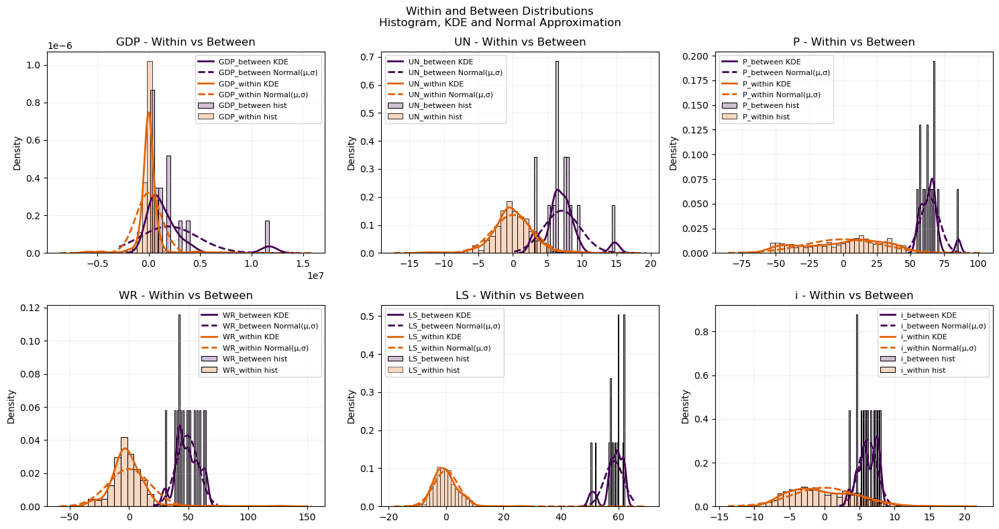

In [169]:
# Data Plotting (variable distribution with respect to the theoretical normal)
# General Layout (column and rows enumeration, figure's size, sub_plot)
# (!!!) For defining the preferred explanatory/dependent variables, we refer to the paper's model 1, which includes in the state vector the following variables:
# target variables = PCOM, GDP, UN, P, WR, LS, i

# //////
# Set-up
# //////

# Target/preferred variables
df = trans_df.copy()
target_variables = ["GDP", "UN", "P", "WR", "LS", "i"]
# Color Palette
COLOR_BETWEEN = "#440154"   
COLOR_WITHIN  = "#E16207" 
# Figure set-up
cols = 3
rows = (len(target_variables) + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 4 * rows))
axes = np.array(axes).flatten()

#////////
# Overlay
#////////

def overlay_one(ax, data, label, color, bins=30):
    data = np.asarray(data.dropna())
    n = len(data)
    if n < 5:
        return
    mu = data.mean()
    sd = data.std(ddof=1)
# Data distribution via histogram
    sns.histplot(
        data,
        bins=bins,
        stat="density",
        alpha=0.25,
        color=color,
        ax=ax,
        label=f"{label} hist"
    )
# Kernel density via KDE curve
    sns.kdeplot(
        data,
        ax=ax,
        color=color,
        linewidth=2,
        label=f"{label} KDE"
    )
# Normal curve (μ, σ)
# (!!!) With the same empirical mean and variance
    xmin, xmax = ax.get_xlim()
# (!!!) Random guess between xmin and xmax (200 trials)
    x = np.linspace(xmin, xmax, 200)
    ax.plot(
        x,
        norm.pdf(x, mu, sd),
        linestyle="--",
        linewidth=2,
        color=color,
        label=f"{label} Normal(μ,σ)"
    )

#/////////
# Plotting
# ////////

# we iterate over i (just the axis) and target variables
for i, var in enumerate(target_variables):
    ax = axes[i]
    within_col = f"{var}_within"
    between_col = f"{var}_between"

# Between Distribution
# (!!!) overlay_one function call
    overlay_one(ax, df[between_col], f"{var}_between", COLOR_BETWEEN)
# Within Distribution 
    overlay_one(ax, df[within_col], f"{var}_within", COLOR_WITHIN)
# Graph setttings
    ax.set_title(f"{var} - Within vs Between")
    ax.grid(alpha=0.2)
    ax.legend(fontsize=8)

# /////////
# Cosmetics
# /////////

# Manual deletion of unused panels
for j in range(len(target_variables), len(axes)):
    fig.delaxes(axes[j])
plt.suptitle("Within and Between Distributions\nHistogram, KDE and Normal Approximation")

plt.tight_layout()
plt.show()

In [170]:
# General outlook on descriptive statistic of within and between transformed preferred (target) variables
# Count, mean, std, min, max, intra-quartiles (25th, 50th, 75th) + Skewness, Kurtosis
# We also traspose the original dataset to highlight comparability of same-class statistics among variables

target_variables = [
    "GDP_between", "UN_between", "P_between", "WR_between", "LS_between", "i_between",
    "GDP_within", "UN_within", "P_within", "WR_within", "LS_within", "i_within"
]

df = trans_df[target_variables]                
desc_df = df.describe().T                         

desc_df["skewness"] = df.skew()                    
desc_df["kurtosis"] = df.kurtosis()                

desc_df

,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis
GDP_between,750.0,1.941396e+06,2.824305e+06,1.674476e+05,322011.908440,1.047213e+06,1.993680e+06,1.171694e+07,2.713909,6.713787
UN_between,750.0,7.088013e+00,2.641791e+00,3.083232e+00,6.152113,6.575082e+00,7.921944e+00,1.476560e+01,1.233022,2.491660
P_between,750.0,6.434373e+01,7.171897e+00,5.450400e+01,58.646000,6.444200e+01,6.730400e+01,8.534600e+01,1.376696,2.400780
WR_between,750.0,4.898961e+01,9.312723e+00,3.016226e+01,42.628208,4.894083e+01,5.678830e+01,6.467669e+01,-0.018137,-0.647404
LS_between,750.0,5.839143e+01,3.358456e+00,5.016000e+01,57.124000,5.958400e+01,6.160200e+01,6.205800e+01,-1.195510,0.677392
i_between,750.0,6.186977e+00,1.309032e+00,3.481471e+00,5.288750,6.111655e+00,7.426312e+00,8.038087e+00,-0.384371,-0.847142
GDP_within,750.0,3.973643e-11,1.249641e+06,-6.530101e+06,-199425.742930,-1.037962e+04,2.367219e+05,8.212038e+06,0.555017,15.892677
UN_within,741.0,3.835588e-17,2.938705e+00,-1.323700e+01,-1.580318,-1.103573e-01,1.646378e+00,1.132812e+01,-0.182776,2.657618
P_within,750.0,3.031649e-16,2.865148e+01,-5.384600e+01,-22.894000,5.422000e+00,2.262300e+01,4.989200e+01,-0.284871,-1.046338
WR_within,740.0,1.305862e-15,1.767866e+01,-3.434230e+01,-8.378310,-2.144614e+00,6.009849e+00,1.301895e+02,2.965889,16.695920


In [171]:
# Extreme observations analysis: high leverage observations - BETWEEN
# Percentiles mask for each variable 
# (!!!) The mask is a boolean that turns True when the value falls in the top 90% or bottom 10% tier of observations 
# (!!!) Like as expected for the GDP is mainly Japan and US located way far from the average (n is also very low in this case, 15)

# Set up for teh df construction with target variables and only unique values
target_variables = [
    "GDP_between", "UN_between", "P_between",
    "WR_between", "LS_between", "i_between"
]
unique_df = {
    var: pd.Series(trans_df[var].dropna().unique())
    for var in target_variables
}
unique_df = pd.DataFrame(unique_df)

# Outliers (90th and 10th percentile off)
outlier_df = pd.DataFrame()
for var in target_variables:
    q10 = unique_df[var].quantile(0.10)
    q90 = unique_df[var].quantile(0.90)
    outlier_df[var] = (unique_df[var][(unique_df[var] <= q10) | (unique_df[var] >= q90)].reset_index(drop=True))

outlier_df

,GDP_between,UN_between,P_between,WR_between,LS_between,i_between
0,1.674476e+05,9.349016,57.008,38.671163,61.7975,7.739117
1,3.944491e+06,3.083232,70.654,64.676690,62.0580,4.546587
2,2.078842e+05,3.291589,85.346,30.162262,51.8580,3.481471
3,1.171694e+07,14.765596,54.504,63.423602,50.1600,8.038087


In [172]:
# Extreme observations analysis: high leverage observations - WITHIN
# Percentiles mask for each variable 
# (!!!) The mask is a boolean that turns True when the value falls in the top 98% or bottom 02% tier of observations 
# (!!!) Increased threasholds as N increases
# (!!!) Look at the sign (we have also negatives here)

# Set up for teh df construction with target variables and only unique values
target_variables = [
    "GDP_within", "UN_within", "P_within",
    "WR_within", "LS_within", "i_within"
]
unique_df = {
    var: pd.Series(trans_df[var].dropna().unique())
    for var in target_variables
}
unique_df = pd.DataFrame(unique_df)

# Outliers (95th and 5th percentile off)
outlier_df = pd.DataFrame()
for var in target_variables:
    q02 = unique_df[var].quantile(0.02)
    q98 = unique_df[var].quantile(0.98)
    outlier_df[var] = (unique_df[var][(unique_df[var] <= q02) | (unique_df[var] >= q98)].reset_index(drop=True))

outlier_df

,GDP_within,UN_within,P_within,WR_within,LS_within,i_within
0,-6.530101e+06,-6.494834,46.292,58.144768,9.856,9.872550
1,-6.359281e+06,-6.561438,48.192,68.398657,9.376,12.263970
2,-6.077526e+06,-6.054839,49.892,68.841985,-7.758,9.879097
3,-5.759141e+06,9.040722,-53.052,69.562939,-8.658,11.676113
4,-5.791346e+06,9.243281,-52.252,60.436485,-7.358,12.276113
5,-5.803521e+06,8.064190,-52.704,54.767192,11.510,10.676113
6,-5.484898e+06,7.248562,-52.946,101.460560,10.410,-7.643253
7,-5.196719e+06,7.962032,-52.646,93.662974,9.810,-7.887578
8,-4.835805e+06,8.619743,-52.346,77.584425,9.510,-7.952937
9,-4.617938e+06,-13.237004,-53.846,122.760797,17.010,-7.945978


In [173]:
# Normality Test (Jarque Bera Test) for Within and Between Transformed Data
# H0: Data follow a normal distribution 
# The larger the JB stat, the more the distribution deviates from the normal. The smaller the p-value the greater is the confidence of statistically significant results.
# Default empty dataset, with 3 columns per each cluster of observations
# (!!!) We run the normality test on aggregate data, as it is economically and statistically meaningless to test normality country-by-country
# (!!!) We need to drop NaN otherwise the test loop crashes
df = trans_df.copy().dropna()
target_variables = [
    "GDP_within", "UN_within", "P_within",
    "WR_within", "LS_within", "i_within", 
    "GDP_between", "UN_between", "P_between",
    "WR_between", "LS_between", "i_between"
]
jb_df = pd.DataFrame(columns=["Jarque Bera Stat", "p-value", "Statistical Significance"])

# We loop over each variable to extract its respective JB stat and p-value, to then concatenate each single test results set in an aggregate dataset 
for var in target_variables:
# JB test deployment
    jb_stat = stats.jarque_bera(df[var])[0]
    jb_pvalue = stats.jarque_bera(df[var])[1]

# We add a column ("Statistical Significance") to better visualize the statistical significance confidence thresholds for each variable's JB-stat
    jb_significance = significance_stars(jb_pvalue)

    jb_df = pd.concat(
        [jb_df, pd.DataFrame({"Jarque Bera Stat": [jb_stat], 
                                "p-value": [jb_pvalue], 
                                "Statistical Significance": [jb_significance]})], 
                                ignore_index=True
    )

# Index renaiming with variables full name
jb_df.index = target_variables

print("Jarque Bera Test of Normality for Between and Within Transformed Target Variables (Model 1)")
jb_df

Jarque Bera Test of Normality for Between and Within Transformed Target Variables (Model 1)


,Jarque Bera Stat,p-value,Statistical Significance
GDP_within,4511.798619,0.000000e+00,***
UN_within,117.929832,2.465258e-26,***
P_within,27.971621,8.434120e-07,***
WR_within,37.122681,8.687851e-09,***
LS_within,13.041449,1.472602e-03,**
i_within,36.365799,1.268432e-08,***
GDP_between,1104.870145,1.203639e-240,***
UN_between,414.772786,8.574997e-91,***
P_between,319.553928,4.071422e-70,***
WR_between,7.127801,2.832811e-02,*


In [174]:
# Distributional Equivalence Test (Kolomogorv-Smirnov Test) applied on Normal PDF comparison
# H0: The two samples are drawn from the same distribution
# or in case of comparison with normal PDF -> H0: Sample comes from a normal distribution
# The larger the KS stat, the stronger the evidence that the target samples do not come from the same distributions. Or alternatively, in the case of comparison with the theoretical normal, KS again measure the deviation magnitude pf the sample from the normal PDF. 
# Default empty dataset
df = trans_df.copy().dropna()
target_variables = [
    "GDP_within", "UN_within", "P_within",
    "WR_within", "LS_within", "i_within", 
    "GDP_between", "UN_between", "P_between",
    "WR_between", "LS_between", "i_between"
]
ks_df = pd.DataFrame(columns=["KS Stat (reference = Normal PDF)", "p-value", "Statistical Significance"])

# We loop over each variable to extract its respective KS stat and p-value, to then also compare the distribution with the Normal, as double-check to JB for non-normal distributions
for var in target_variables:

# Kolomogorv-Smirnov Test deployment (reference = Normal PDF)
    ks_stat = kstest(df[var], "norm", args=(df[var].mean(), df[var].std()))[0]
    ks_pvalue = kstest(df[var], "norm", args=(df[var].mean(), df[var].std()))[1]

# We add a column ("Statistical Significance") to better visualize the statistical significance confidence thresholds for each variable's KS-stat
    ks_significance = significance_stars(ks_pvalue)
    
    ks_df = pd.concat(
        [ks_df, pd.DataFrame({"KS Stat (reference = Normal PDF)": [ks_stat], 
                              "p-value": [ks_pvalue], 
                              "Statistical Significance": [ks_significance]})],
        ignore_index=True
    )

# Index renaiming with variables full name
ks_df.index = target_variables

print("Kolomogorv-Smirnov Test of Distributional Equivalence (Between/Within Transformed Target Variables - Normal PDF)")
ks_df

Kolomogorv-Smirnov Test of Distributional Equivalence (Between/Within Transformed Target Variables - Normal PDF)


,KS Stat (reference = Normal PDF),p-value,Statistical Significance
GDP_within,0.258128,7.272547e-35,***
UN_within,0.052627,7.552693e-02,
P_within,0.061567,2.271069e-02,*
WR_within,0.056084,4.853046e-02,*
LS_within,0.034893,4.641943e-01,
i_within,0.087198,2.553531e-04,***
GDP_between,0.304611,1.141881e-48,***
UN_between,0.182396,1.669333e-17,***
P_between,0.216419,1.561126e-24,***
WR_between,0.125107,1.935159e-08,***


##### <span style="color: dodgerblue"> **1.6) FD. FIRST DIFFERENCE VARIABLE TRANSFORMATIONS: Compute the first-differences x(i,t)-x(i,t-1) for panel data. Check for the first 3 changes of individuals (for data sorted by individual and then time) in say 3T+1 first observations that when there is a change of individual in the stacked vector individuals x time, the first differences is a dot for “not available”. In other words, for first-differences for panel data, check that when you change individual, the first observation is missing with a dot, and it is not the difference of the first observation of the second individual minus the last observation of the first individual, for example.** </span>

In [175]:
# First Difference Transformation 
# Key: x_it - x_it-1, generally good to remove time trends, but keep it mind there might be underlying time trends on periodical (lag=1) observations

# (!!!) we keep the reference to raw_data to avoid picking up transformed columns
df = raw_df.copy()
numeric_cols = df.select_dtypes(include="number").columns

# (!!!) no need to groupby for raw_data[c] as it already cross matches with the mean of reference given the index
# (!!!) no need to substitute missing values with ".", as the function .groupby() takes only observations from the same "country" 
# (!!!) command diff() quite nice and 1st observation per country = NaN holds true
for c in numeric_cols: 
    df[f"{c}_1diff"] = (df.groupby("country")[c].diff())

trans_diff_df = df.copy()
trans_diff_df

,year,country,i,P,W,WR,GDP,LS,PCOM,UN,...,WR_1diff,GDP_1diff,LS_1diff,PCOM_1diff,UN_1diff,SHORTUN_1diff,LONGUN_1diff,LF_1diff,REER_1diff,SH_1diff
0,1970-01-01,Australia,7.108333,9.1,6.413648,76.120158,2.835193e+05,59.7,2.113115,1.653364,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1971-01-01,Australia,7.008333,9.6,6.909308,77.071751,2.946057e+05,60.4,2.709369,1.907799,...,0.951593,11086.411,0.7,0.596255,0.254435,NaN,NaN,144.747,3.125608,-0.100000
2,1972-01-01,Australia,5.083333,10.2,7.284607,75.808223,3.023225e+05,60.3,2.925285,2.610752,...,-1.263527,7716.832,-0.1,0.215916,0.702953,NaN,NaN,127.286,1.212941,-1.925000
3,1973-01-01,Australia,6.983333,11.1,8.096658,74.465333,3.147389e+05,60.8,4.174010,2.309362,...,-1.342890,12416.305,0.5,1.248725,-0.301391,NaN,NaN,149.641,11.742600,1.900000
4,1974-01-01,Australia,13.158333,12.9,9.688749,75.817692,3.189447e+05,66.9,13.802962,2.670259,...,1.352359,4205.887,6.1,9.628952,0.360897,NaN,NaN,152.885,1.100326,6.175000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,2015-01-01,USA,0.226667,100.0,65.600000,62.655205,1.820602e+07,56.8,66.099106,5.279920,...,1.035147,479738.889,0.6,-54.303252,-0.887542,-429.084,-891.0,1208.100,13.865398,1.593464
746,2016-01-01,USA,0.644167,101.3,66.400000,62.819300,1.850960e+07,56.8,56.023884,4.869110,...,0.164095,303581.069,0.0,-10.075222,-0.410810,-222.333,-323.0,2057.300,3.452155,1.605116
747,2017-01-01,USA,1.152500,103.4,68.600000,63.695450,1.892457e+07,56.9,69.357989,4.355201,...,0.876150,414969.888,0.1,13.334106,-0.513909,-451.750,-317.0,1132.600,-0.343109,0.493997
748,2018-01-01,USA,2.188333,105.9,70.900000,64.279238,1.948198e+07,56.8,89.358138,3.895676,...,0.583788,557401.598,-0.1,20.000149,-0.459525,-329.333,-339.0,1755.200,-1.238679,0.983952


##### <span style="color: dodgerblue"> **1.7) First differences distributions. Plot the distributions (histogram, KDE, normal law with same mean and standard error) for first difference dependent GDPG and first difference explanatory EDA/GDP for each of these two transformations.** </span>

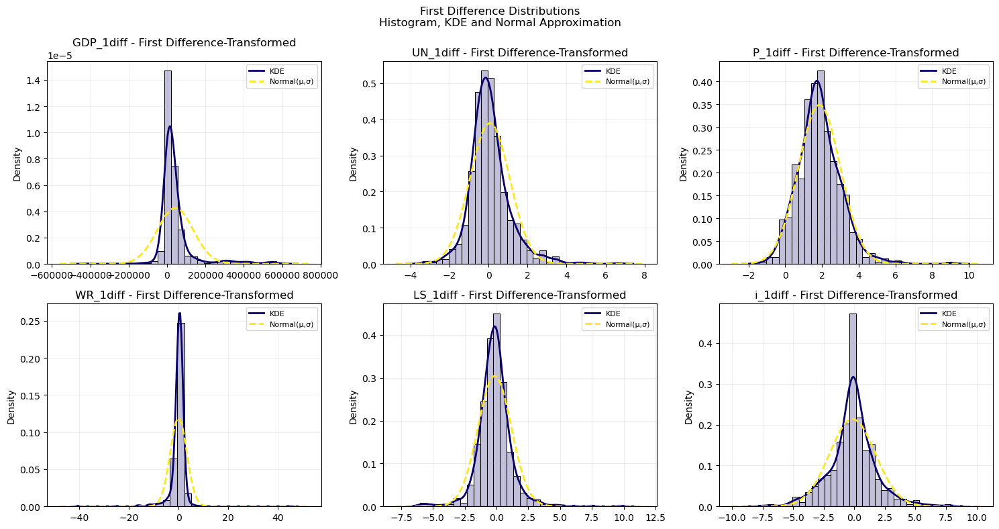

In [176]:
# Data Plotting (1st difference-transformed variable distribution with respect to the theoretical normal)
# General Layout (column and rows enumeration, figure's size, sub_plot)

# //////
# Set-up
# //////

# Target/preferred variables
# (!!!) I made the mistake of using trans_df instead of trans_diff_df 5 times I guess 
df = trans_diff_df.copy()
target_variables = ["GDP_1diff", "UN_1diff", "P_1diff", "WR_1diff", "LS_1diff", "i_1diff"]  

# Figure set-up
cols = 3
rows = (len(target_variables) + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 4 * rows))
axes = np.array(axes).flatten()

#////////
# Overlay
#////////

def overlay_one(ax, data, label, bins=30):
    data = np.asarray(data.dropna())
    n = len(data)
    if n < 5:
        return
    mu = data.mean()
    sd = data.std(ddof=1)
# Data distribution via histogram
    sns.histplot(
        data,
        bins=bins,
        stat="density",
        alpha=0.25,
        color="#0B006A",
        ax=ax
    )
# Kernel density via KDE curve
    sns.kdeplot(
        data,
        ax=ax,
        color="#0B006A",
        linewidth=2,
        label="KDE"
    )
# Normal curve (μ, σ)
# (!!!) With the same empirical mean and variance
    xmin, xmax = ax.get_xlim()
# (!!!) Random guess between xmin and xmax (200 trials)
    x = np.linspace(xmin, xmax, 200)
    ax.plot(
        x,
        norm.pdf(x, mu, sd),
        linestyle="--",
        linewidth=2,
        color="#FDE725",
        label="Normal(μ,σ)"
    )

#/////////
# Plotting
# ////////

# we iterate over i (just the axis) and target variables
for i, var in enumerate(target_variables):
    ax = axes[i]

# Between Distribution
# (!!!) overlay_one function call
    overlay_one(ax, df[var], var)

# Graph setttings
    ax.set_title(f"{var} - First Difference-Transformed")
    ax.grid(alpha=0.2)
    ax.legend(fontsize=8)

# /////////
# Cosmetics
# /////////

# Manual deletion of unused panels
for j in range(len(target_variables), len(axes)):
    fig.delaxes(axes[j])
plt.suptitle("First Difference Distributions\nHistogram, KDE and Normal Approximation")

plt.tight_layout()
plt.show()

In [177]:
# Normality Test (Jarque Bera Test) for First Difference Transformed Data
# H0: Data follow a normal distribution 
# The larger the JB stat, the more the distribution deviates from the normal. The smaller the p-value the greater is the confidence of statistically significant results.
# Default empty dataset, with 3 columns per each cluster of observations
df = trans_diff_df.copy().dropna()
target_variables = [
    "GDP_1diff", "UN_1diff", "P_1diff",
    "WR_1diff", "LS_1diff", "i_1diff", 
]
jb_diff_df = pd.DataFrame(columns=["Jarque Bera Stat", "p-value", "Statistical Significance"])

# We loop over each variable to extract its respective JB stat and p-value, to then concatenate each single test results set in an aggregate dataset 
for var in target_variables:
# JB test deployment
    jb_diff_stat = stats.jarque_bera(df[var])[0]
    jb_diff_pvalue = stats.jarque_bera(df[var])[1]

# We add a column ("Statistical Significance") to better visualize the statistical significance confidence thresholds for each variable's JB-stat
    jb_diff_significance = significance_stars(jb_pvalue)

    jb_diff_df = pd.concat(
        [jb_diff_df, pd.DataFrame({"Jarque Bera Stat": [jb_diff_stat], 
                                "p-value": [jb_diff_pvalue], 
                                "Statistical Significance": [jb_diff_significance]})], 
                                ignore_index=True
    )

# Index renaiming with variables full name
jb_diff_df.index = target_variables

print("Jarque Bera Test of Normality for First Difference Transformed Target Variables (Model 1)")
jb_diff_df

Jarque Bera Test of Normality for First Difference Transformed Target Variables (Model 1)


,Jarque Bera Stat,p-value,Statistical Significance
GDP_1diff,3011.514795,0.000000e+00,***
UN_1diff,1087.342608,7.701100e-237,***
P_1diff,33.870383,4.417126e-08,***
WR_1diff,95.673881,1.677570e-21,***
LS_1diff,270.722692,1.634234e-59,***
i_1diff,70.209336,5.678535e-16,***


##### <span style="color: dodgerblue"> **1.8) First differences simple correlation. For these FD transformed variables, plot the bivariate cloud of points with regression line and on top the marginal distribution of the horizontal axis and on right hand side the marginal distribution of the variable on the vertical axis. Compare with one-way-fixed effects and between distributions. Report the simple correlation coefficient on the graph.** </span>

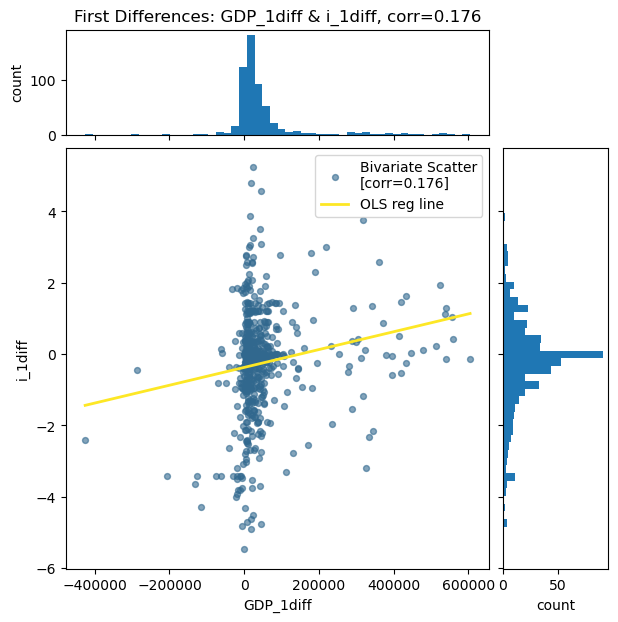

In [178]:
# Bivariate Cloud of Points Plotting for First Difference - Transformed Variables 
# Target Variables: GDP (Real Gross Domestic Product) and i (Short-Term Interest Rate)
# (!!!) We have a state space vector as we are working with VAR and not two single defined main dependent and explanatory variables

# //////
# Set-up
# //////

# Defining target variables (1st differences)
df = trans_diff_df.copy().dropna()
x = "GDP_1diff"
y = "i_1diff"
X = df[x]
Y = df[y]
# Simple correlation coefficient computation
corr = np.corrcoef(X, Y)[0, 1]

# Regression line (OLS) 
slope, intercept = np.polyfit(X, Y, 1)
xx = np.linspace(X.min(), X.max(), 200)
yy = slope * xx + intercept

# ////////
# Plotting
# ////////
# Cloud of Points + reg line + marginals of distribution (top/right)
fig = plt.figure(figsize=(7, 7))
gs = fig.add_gridspec(2, 2, height_ratios=(1, 4), width_ratios=(4, 1),
                      hspace=0.05, wspace=0.05)
# (!!!) New grid to build the top and right-sided distribution graphs
ax_top  = fig.add_subplot(gs[0, 0])
ax_main = fig.add_subplot(gs[1, 0], sharex=ax_top)
ax_right= fig.add_subplot(gs[1, 1], sharey=ax_main)

# Cloud of Points (scatter) + regression line
ax_main.scatter(X, Y, s=18, alpha=0.6, color="#31688E", label=f"Bivariate Scatter\n[corr={corr:.3f}]")
ax_main.plot(xx, yy, linewidth=2, label="OLS reg line", color="#FDE725")
ax_main.set_xlabel(f"{x}")
ax_main.set_ylabel(f"{y}")
ax_main.legend()

# Top marginal (X)
ax_top.hist(X, bins=50)
ax_top.tick_params(axis="x", labelbottom=False)
ax_top.set_ylabel("count")
ax_top.set_title(f"First Differences: {x} & {y}, corr={corr:.3f}")

# Right marginal (Y)
ax_right.hist(Y, bins=50, orientation="horizontal")
ax_right.tick_params(axis="y", labelleft=False)
ax_right.set_xlabel("count")

plt.show()

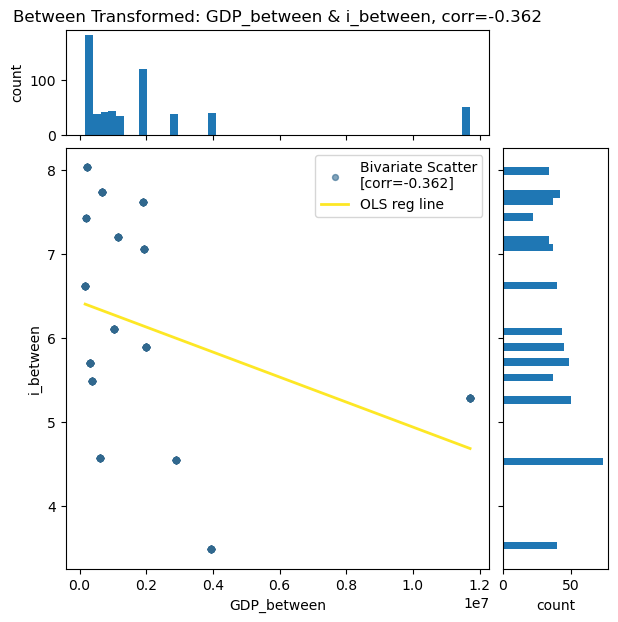

In [179]:
# Bivariate Cloud of Points Plotting for Between - Transformed Variables 
# Target Variables: GDP (Real Gross Domestic Product) and i (Short-Term Interest Rate)
# (!!!) We have a state space vector as we are working with VAR and not two single defined main dependent and explanatory variables

# //////
# Set-up
# //////

# Defining target variables (between)
df = trans_df.copy().dropna()
x = "GDP_between"
y = "i_between"
X = df[x]
Y = df[y]
# Simple correlation coefficient computation
corr = np.corrcoef(X, Y)[0, 1]

# Regression line (OLS) 
slope, intercept = np.polyfit(X, Y, 1)
xx = np.linspace(X.min(), X.max(), 200)
yy = slope * xx + intercept

# ////////
# Plotting
# ////////
# Cloud of Points + reg line + marginals of distribution (top/right)
fig = plt.figure(figsize=(7, 7))
gs = fig.add_gridspec(2, 2, height_ratios=(1, 4), width_ratios=(4, 1),
                      hspace=0.05, wspace=0.05)
# (!!!) New grid to build the top and right-sided distribution graphs
ax_top  = fig.add_subplot(gs[0, 0])
ax_main = fig.add_subplot(gs[1, 0], sharex=ax_top)
ax_right= fig.add_subplot(gs[1, 1], sharey=ax_main)

# Cloud of Points (scatter) + regression line
ax_main.scatter(X, Y, s=18, alpha=0.6, color="#31688E", label=f"Bivariate Scatter\n[corr={corr:.3f}]")
ax_main.plot(xx, yy, linewidth=2, label="OLS reg line", color="#FDE725")
ax_main.set_xlabel(f"{x}")
ax_main.set_ylabel(f"{y}")
ax_main.legend()

# Top marginal (X)
ax_top.hist(X, bins=50)
ax_top.tick_params(axis="x", labelbottom=False)
ax_top.set_ylabel("count")
ax_top.set_title(f"Between Transformed: {x} & {y}, corr={corr:.3f}")

# Right marginal (Y)
ax_right.hist(Y, bins=50, orientation="horizontal")
ax_right.tick_params(axis="y", labelleft=False)
ax_right.set_xlabel("count")

plt.show()

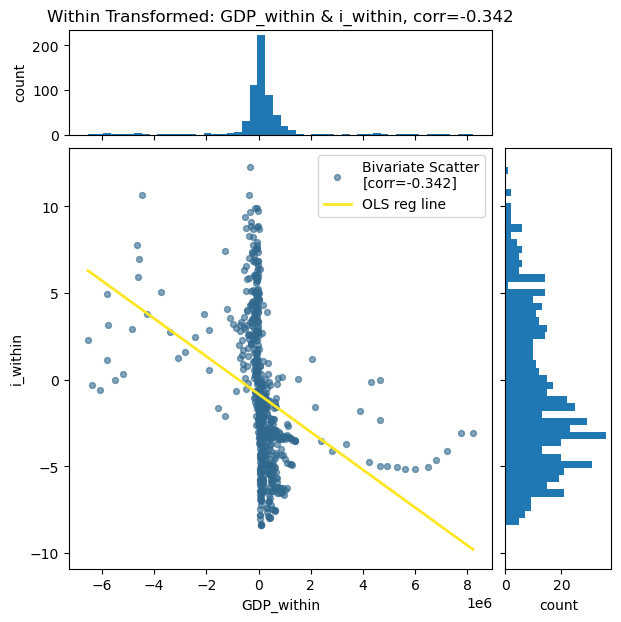

In [180]:
# Bivariate Cloud of Points Plotting for Within - Transformed Variables 
# Target Variables: GDP (Real Gross Domestic Product) and i (Short-Term Interest Rate)
# (!!!) We have a state space vector as we are working with VAR and not two single defined main dependent and explanatory variables

# //////
# Set-up
# //////

# Defining target variables (within)
df = trans_df.copy().dropna()
x = "GDP_within"
y = "i_within"
X = df[x]
Y = df[y]
# Simple correlation coefficient computation
corr = np.corrcoef(X, Y)[0, 1]

# Regression line (OLS) 
slope, intercept = np.polyfit(X, Y, 1)
xx = np.linspace(X.min(), X.max(), 200)
yy = slope * xx + intercept

# ////////
# Plotting
# ////////
# Cloud of Points + reg line + marginals of distribution (top/right)
fig = plt.figure(figsize=(7, 7))
gs = fig.add_gridspec(2, 2, height_ratios=(1, 4), width_ratios=(4, 1),
                      hspace=0.05, wspace=0.05)
# (!!!) New grid to build the top and right-sided distribution graphs
ax_top  = fig.add_subplot(gs[0, 0])
ax_main = fig.add_subplot(gs[1, 0], sharex=ax_top)
ax_right= fig.add_subplot(gs[1, 1], sharey=ax_main)

# Cloud of Points (scatter) + regression line
ax_main.scatter(X, Y, s=18, alpha=0.6, color="#31688E", label=f"Bivariate Scatter\n[corr={corr:.3f}]")
ax_main.plot(xx, yy, linewidth=2, label="OLS reg line", color="#FDE725")
ax_main.set_xlabel(f"{x}")
ax_main.set_ylabel(f"{y}")
ax_main.legend()

# Top marginal (X)
ax_top.hist(X, bins=50)
ax_top.tick_params(axis="x", labelbottom=False)
ax_top.set_ylabel("count")
ax_top.set_title(f"Within Transformed: {x} & {y}, corr={corr:.3f}")

# Right marginal (Y)
ax_right.hist(Y, bins=50, orientation="horizontal")
ax_right.tick_params(axis="y", labelleft=False)
ax_right.set_xlabel("count")

plt.show()

##### <span style="color: dodgerblue"> **1.9) Restricted sample with a BALANCED PANEL: Two way fixed effects (TWFE) formula. Restrict the sample to the countries/individuals available with the longest duration (N=… countries over T=… periods). Compute -x(.t)+x(..), report the 6 numbers in a table as a function of time and plot them as a function of time, then comment. Then compute two-way-fixed-effects x(it)-x(i.)-x(.t)+x(..) transformed variables.** </span>

In [181]:
# Balanced Panel Set-Up 1st cleaning 
# N = 15 (all countries)
# T common for all and starting from 1980 for each variable as we are working with a PVAR model
# T starts at 1985 (minimum common across variables and countries)

balanced_raw_df = raw_df[raw_df["year"] >= pd.Timestamp("1985-01-01")].copy()
balanced_raw_df

,year,country,i,P,W,WR,GDP,LS,PCOM,UN,SHORTUN,LONGUN,LF,REER,SH
15,1985-01-01,Australia,15.982500,36.4,20.283334,57.628634,4.382016e+05,60.5,36.146213,8.263231,318.6241,284.244,7295.791,86.667199,15.982500
16,1986-01-01,Australia,16.451667,39.7,20.628723,54.842286,4.494163e+05,60.1,21.850390,8.089849,347.0404,266.082,7578.910,77.602031,16.451667
17,1987-01-01,Australia,13.750000,43.1,21.071155,52.434170,4.752908e+05,58.1,24.517931,8.115562,349.9544,278.907,7748.834,78.385268,13.750000
18,1988-01-01,Australia,12.800000,46.2,21.517871,49.432427,4.937103e+05,57.0,21.191835,7.234924,333.4893,242.730,7964.414,86.710124,12.800000
19,1989-01-01,Australia,17.611667,49.7,22.217844,47.327337,5.113678e+05,57.9,24.662863,6.177543,313.7350,194.333,8224.435,93.598627,17.611667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,2015-01-01,USA,0.226667,100.0,65.600000,62.655205,1.820602e+07,56.8,66.099106,5.279920,5968.3330,2328.000,157129.900,115.215974,-1.142704
746,2016-01-01,USA,0.644167,101.3,66.400000,62.819300,1.850960e+07,56.8,56.023884,4.869110,5746.0000,2005.000,159187.200,118.668129,0.462412
747,2017-01-01,USA,1.152500,103.4,68.600000,63.695450,1.892457e+07,56.9,69.357989,4.355201,5294.2500,1688.000,160319.800,118.325019,0.956409
748,2018-01-01,USA,2.188333,105.9,70.900000,64.279238,1.948198e+07,56.8,89.358138,3.895676,4964.9170,1349.000,162075.000,117.086340,1.940361


In [ ]:
# Balanced Panel TWFE
# (!!!) Note that our dataset is already more or less balanced for all the target variables 
# (!!!) We do have few exceptions where we typically miss the first 10 years of observations

target_variables = balanced_raw_df.select_dtypes(include="number").columns
checkpoint = []

# (!!!) The balancing applies to each single variable independently and not generally to the whole dataset, as a tighter restriction (reduced N) would affect all the variables regardless from their actual time availability
for var in target_variables: 
    df = balanced_raw_df[["year", "country", var]].copy()
# (!!!) Again we dropna() only for the specific variable investigated in the loop
    df = df.dropna(subset=["year", "country", var]).copy()

# //////////////////////////
# Balanced Panel Restriction
# //////////////////////////
# We keep only the units observed in all T periods for each variable specificately
# We create a mask based on observations shared across countries and same time
#    all_years = sorted(df["year"].unique())
#    T = len(all_years)
#    balanced_countries = (
#        df.groupby("country")["year"]
#        .nunique()
#        .loc[lambda s: s == T]
#        .index
#    )
#    df = df[df["country"].isin(balanced_countries)].copy()
# Now, we keep times observed for all remaining countries
# (!!!) We just do the opposite as we did for countries
#    N = df["country"].nunique()
#    balanced_years = (
#        df.groupby("year")["country"]
#        .nunique()
#        .loc[lambda s: s == N]
#        .index
#    )
#    df = df[df["year"].isin(balanced_years)].copy()
# Double Check and Resorting
#    first_year_by_country = df.groupby("country")["year"].min()
#    t0_common = first_year_by_country.max()
#    df = df[df["year"] >= t0_common].copy()
#    df = df.sort_values(["country", "year"]).reset_index(drop=True)

# /////////////////
# Means Computation
# /////////////////
# We need: x_i., x_.t, x_.. 
    df[f"{var}_it"] = df[var]
    df[f"{var}_i."] = df.groupby("country")[var].transform("mean")   
    df[f"{var}_.t"] = df.groupby("year")[var].transform("mean")
# (!!!) Useless as column, better to express it as variable     
    x_totmean = df[var].mean()                                        
    df[f"{var}_.."] = x_totmean
# Now: -x(.t) + x(..)
# (!!!) Rememember the minus (-)
    df[f"{var} (-x_.t+x_..)"] = -df[f"{var}_.t"] + x_totmean

# ////////////////
# TWFE Computation
# ////////////////
    df[f"{var}_TWFE"] = (
        df[f"{var}_it"]
        - df[f"{var}_i."]
        - df[f"{var}_.t"]
        + df[f"{var}_.."]
    )     

# Only transformed columns 
    keep_cols = [
        "country", "year",
        f"{var}_it",
        f"{var}_i.",
        f"{var}_.t",
        f"{var}_..",
        f"{var} (-x_.t+x_..)",
        f"{var}_TWFE",
    ]
    checkpoint.append(df[keep_cols])

# ///////////////////
# Merging - Unique DF
# ///////////////////
# One row per (country, year, variable) with the computed columns
TWFE_balanced_df = checkpoint[0].copy()
for d in checkpoint[1:]:
    TWFE_balanced_df = TWFE_balanced_df.merge(d, on=["country", "year"], how="outer")

# Ordering and time indexing
id_cols = ["year", "country"]
var_cols = [c for c in TWFE_balanced_df.columns if c not in id_cols]
TWFE_balanced_df = TWFE_balanced_df[id_cols + var_cols]
TWFE_balanced_df = TWFE_balanced_df.set_index("year")

TWFE_balanced_df

,country,i_it,i_i.,i_.t,i_..,i (-x_.t+x_..),i_TWFE,P_it,P_i.,P_.t,...,REER_.t,REER_..,REER (-x_.t+x_..),REER_TWFE,SH_it,SH_i.,SH_.t,SH_..,SH (-x_.t+x_..),SH_TWFE
year,,,,,,,,,,,,,,,,,,,,,
1985-01-01,Australia,15.982500,6.623452,11.546997,4.595246,-6.951751,2.407297,36.4,73.040000,48.960000,...,93.274947,98.085042,4.810095,-1.130720,15.982500,6.623452,11.546997,3.913097,-7.633900,1.725147
1986-01-01,Australia,16.451667,6.623452,10.081143,4.595246,-5.485897,4.342317,39.7,73.040000,50.666667,...,96.729686,98.085042,1.355356,-13.650627,16.451667,6.623452,10.081143,3.913097,-6.168047,3.660168
1987-01-01,Australia,13.750000,6.623452,9.541558,4.595246,-4.946312,2.180236,43.1,73.040000,52.500000,...,98.823146,98.085042,-0.738104,-14.960849,13.750000,6.623452,9.541558,3.913097,-5.628461,1.498087
1988-01-01,Australia,12.800000,6.623452,9.196550,4.595246,-4.601304,1.575244,46.2,73.040000,54.486667,...,100.006449,98.085042,-1.921407,-7.819297,12.800000,6.623452,9.196550,3.913097,-5.283453,0.893094
1989-01-01,Australia,17.611667,6.623452,11.224394,4.595246,-6.629148,4.359067,49.7,73.040000,57.146667,...,100.164782,98.085042,-2.079739,-1.089126,17.611667,6.623452,11.224394,3.913097,-7.311297,3.676917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-01-01,USA,0.226667,3.744857,0.322917,4.595246,4.272329,0.754139,100.0,76.902857,100.000000,...,95.704948,98.085042,2.380094,12.279917,-1.142704,3.315609,-1.537036,3.913097,5.450133,0.991821
2016-01-01,USA,0.644167,3.744857,0.148935,4.595246,4.446311,1.345621,101.3,76.902857,100.880000,...,96.344307,98.085042,1.740736,15.092713,0.462412,3.315609,-2.361097,3.913097,6.274194,3.420998
2017-01-01,USA,1.152500,3.744857,0.126683,4.595246,4.468563,1.876206,103.4,76.902857,102.460000,...,96.596401,98.085042,1.488641,14.497509,0.956409,3.315609,-3.081111,3.913097,6.994207,4.635008


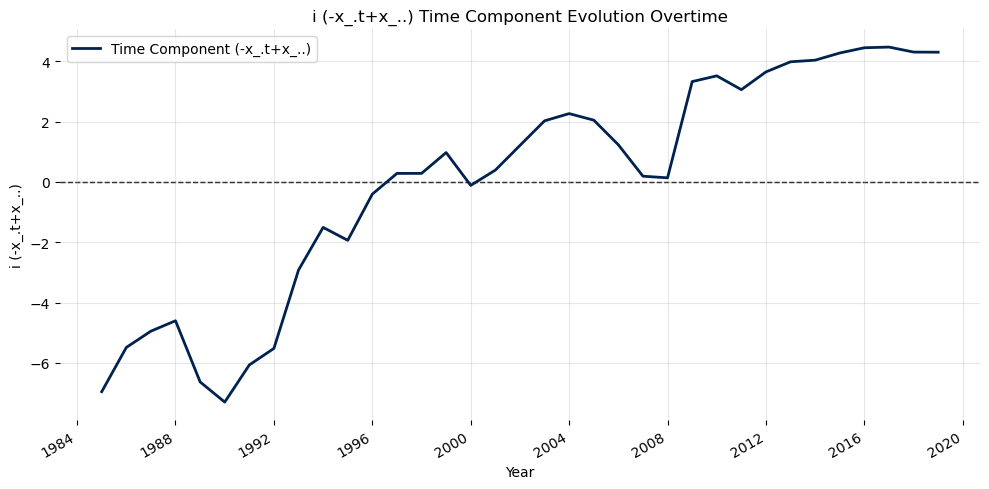

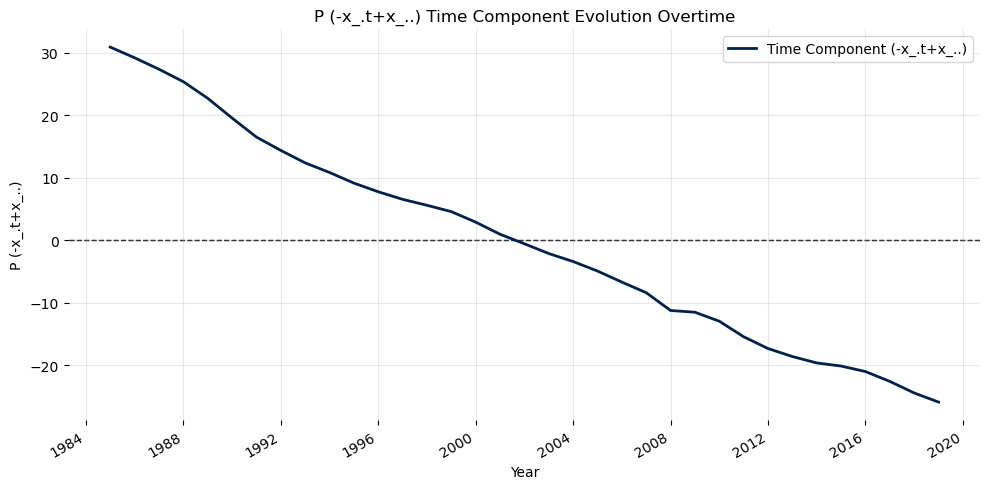

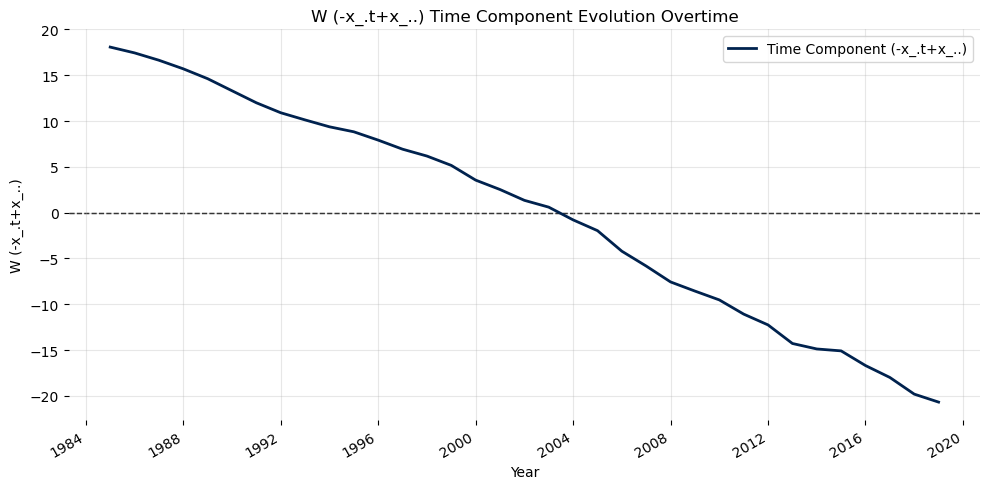

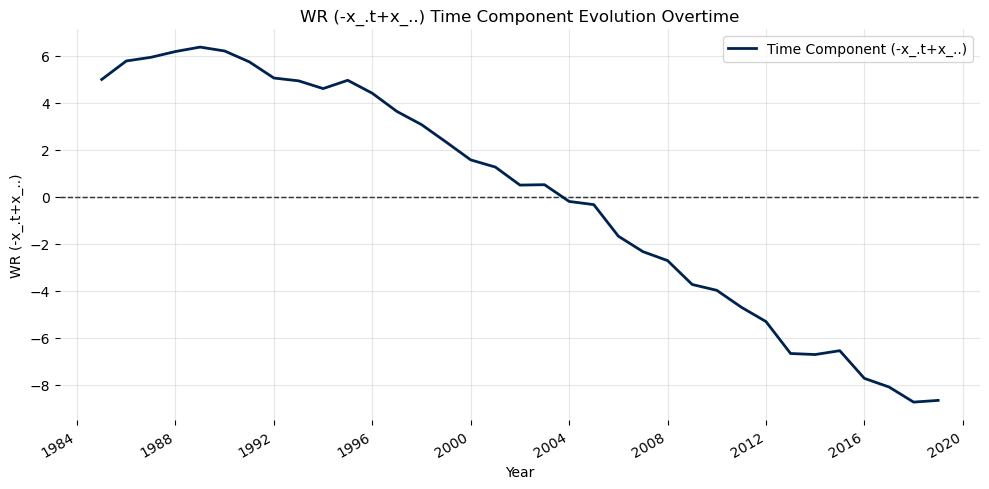

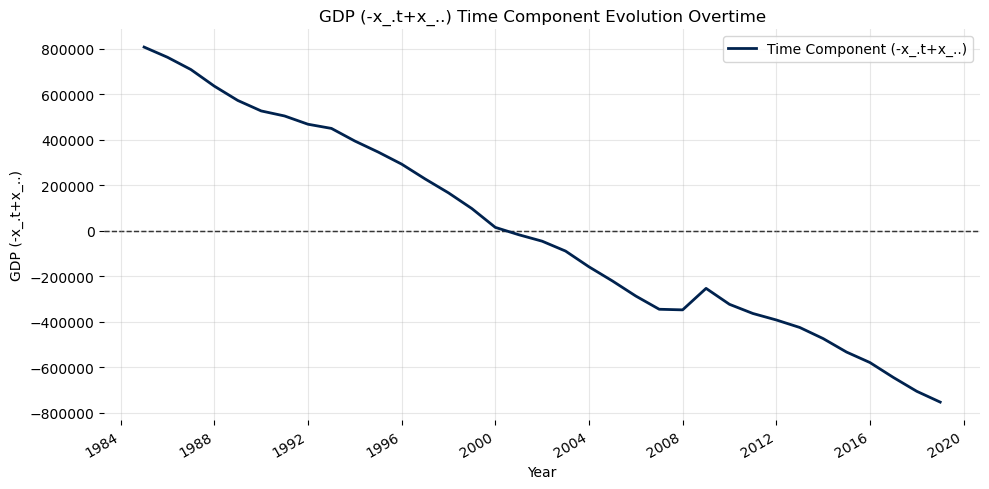

...

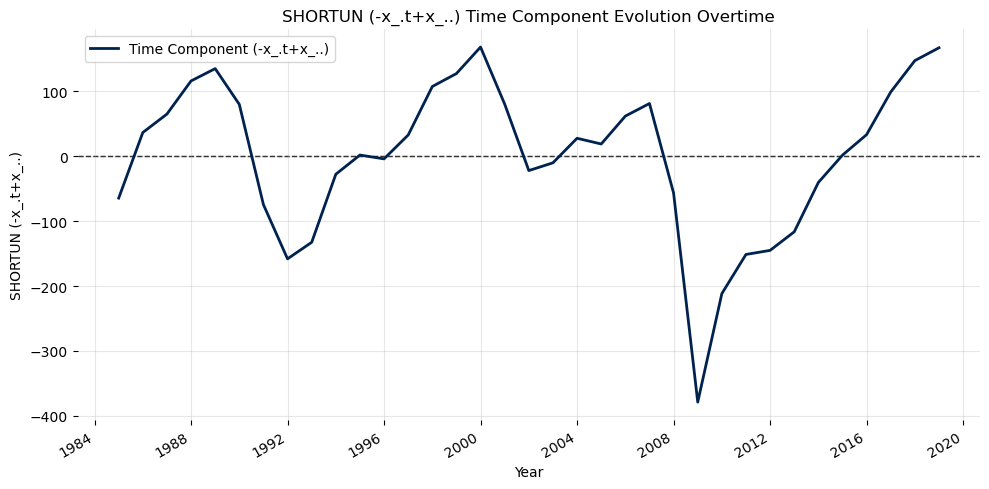

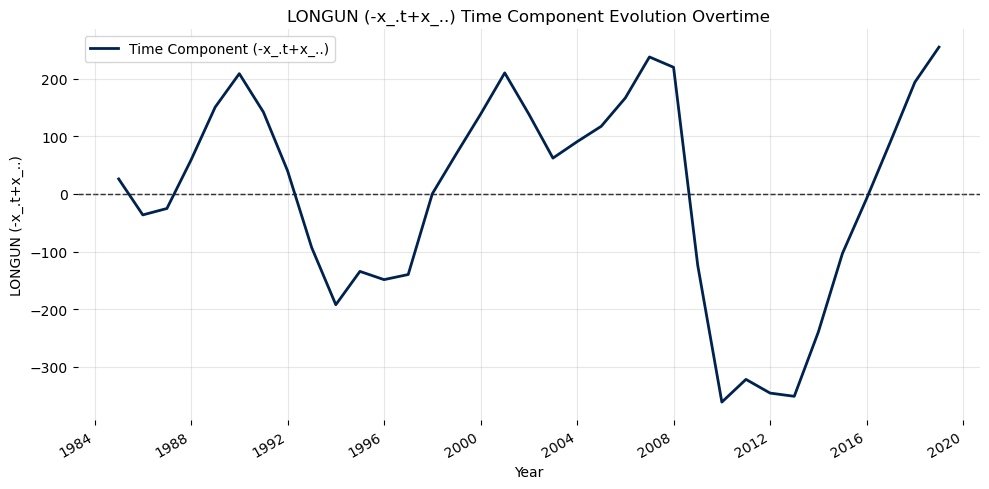

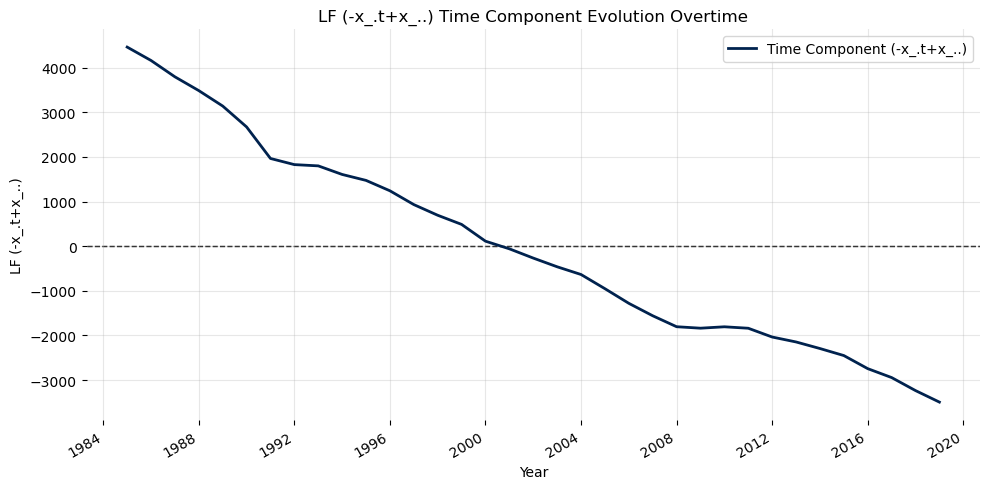

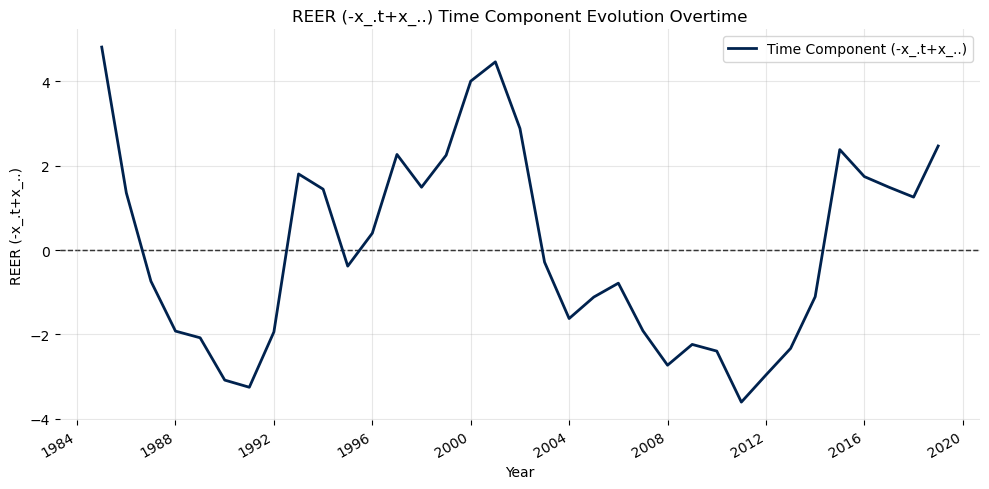

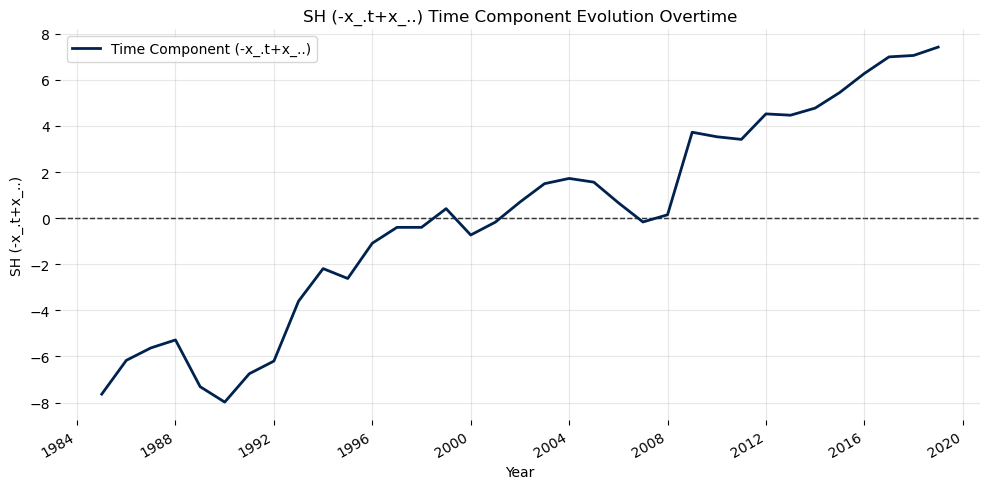

In [183]:
# Time Component (-x_.t+x_..) - Over time plotting 

# //////
# Set-up
# //////
# Target countries and variables
target_countries = ["Australia"]
target_variables = ["i (-x_.t+x_..)", "P (-x_.t+x_..)", "W (-x_.t+x_..)", "WR (-x_.t+x_..)", "GDP (-x_.t+x_..)", "LS (-x_.t+x_..)", "PCOM (-x_.t+x_..)", "UN (-x_.t+x_..)",
       "SHORTUN (-x_.t+x_..)", "LONGUN (-x_.t+x_..)", "LF (-x_.t+x_..)", "REER (-x_.t+x_..)", "SH (-x_.t+x_..)"]
# Country color mapping 
# (!!!) Same for all
country_colors = {
    "Australia": "#00224e"}

#/////////
# Plotting
#/////////
# Loop on variable (without country and time)
for var in target_variables: 
# (!!!) nice way to exclude country (index not var)
    if var == "country":
        continue
# Plot set-up
    fig, ax = plt.subplots(figsize=(10, 5))
# Loop on country
# (!!!) Check countries naming
    for country in target_countries: 
        df = TWFE_balanced_df[TWFE_balanced_df["country"].str.contains(country, na=False)]
        df = df[["country", var]]
        ax.plot(
            df.index,
            df[var],
            label= "Time Component (-x_.t+x_..)",
            linewidth=2,
            color = country_colors.get(country)
        )

    # 0 line
    ax.axhline(
    y=0,
    color="black",
    linewidth=1,
    linestyle="--",
    zorder=0
    )

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.set_title(f"{var} Time Component Evolution Overtime")
    ax.set_xlabel("Year")
    ax.set_ylabel(f"{var}")
    ax.grid(True, alpha=0.3)
    ax.legend()

    fig.autofmt_xdate()

    plt.tight_layout()
    plt.show()

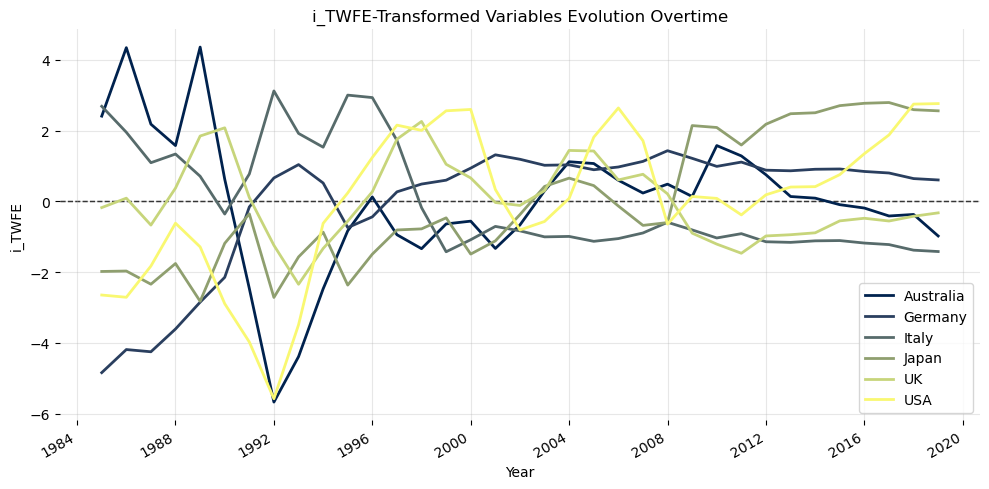

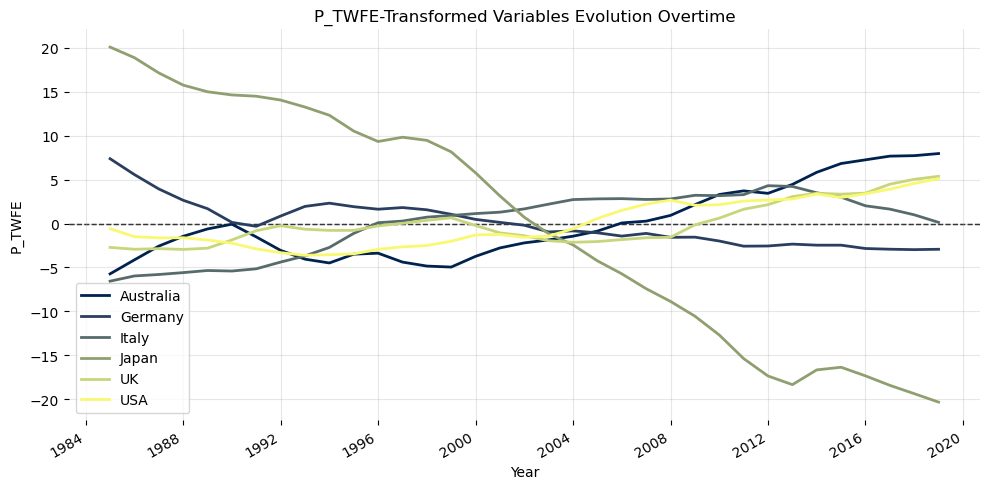

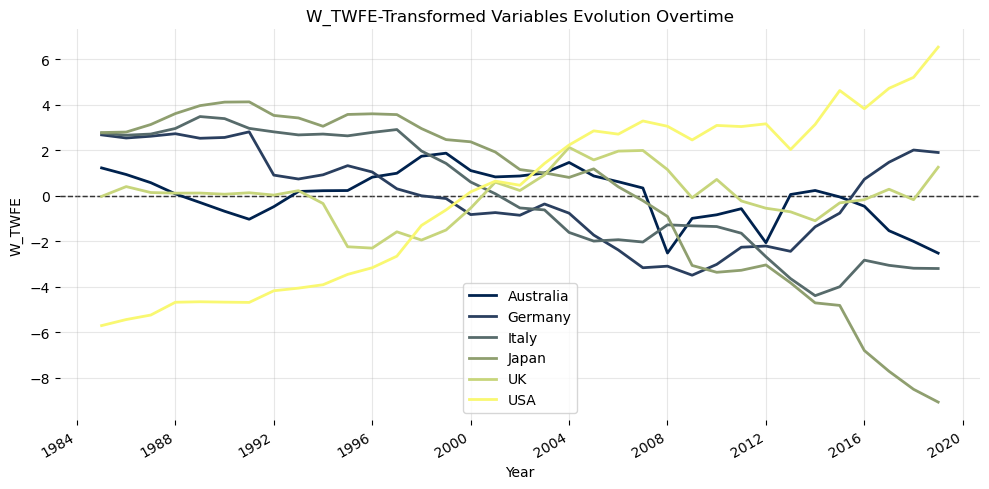

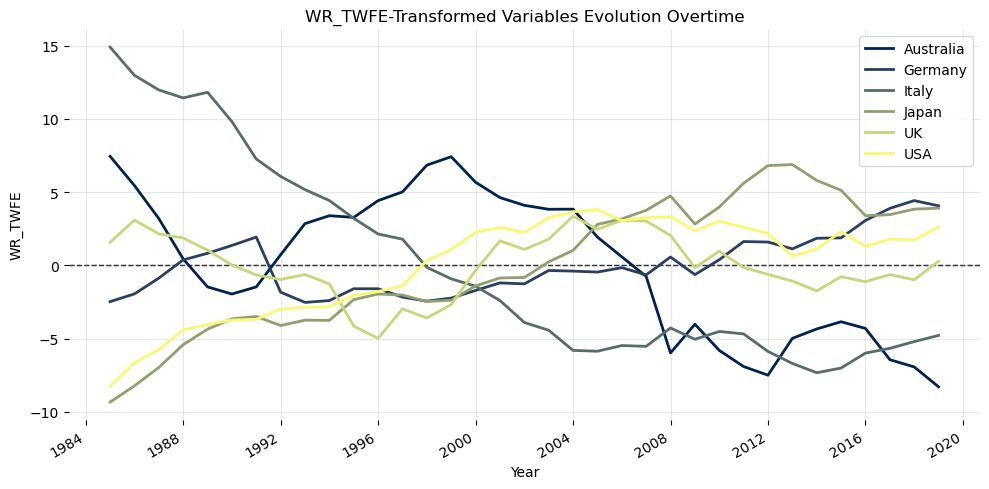

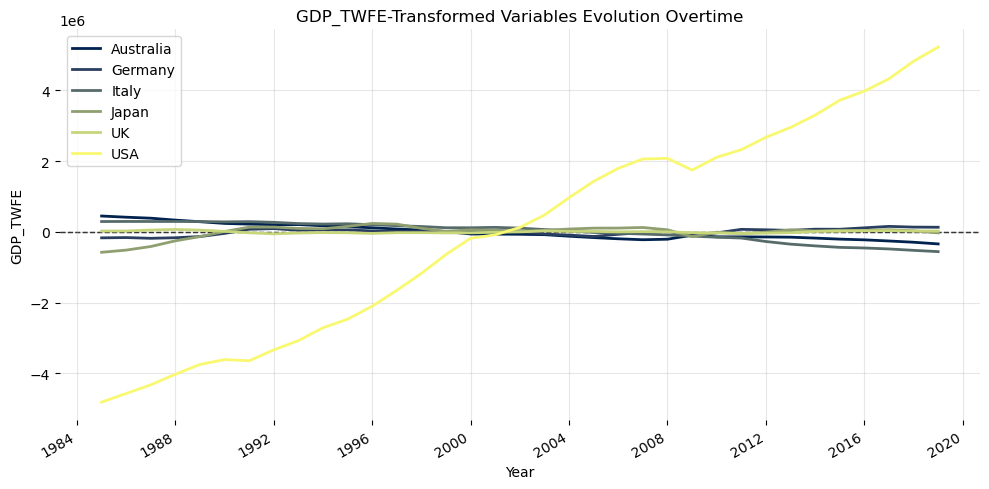

...

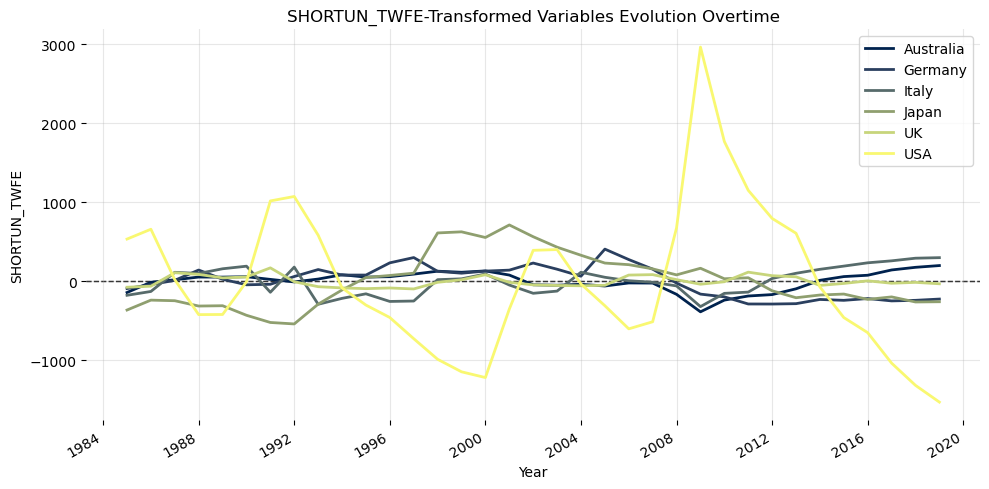

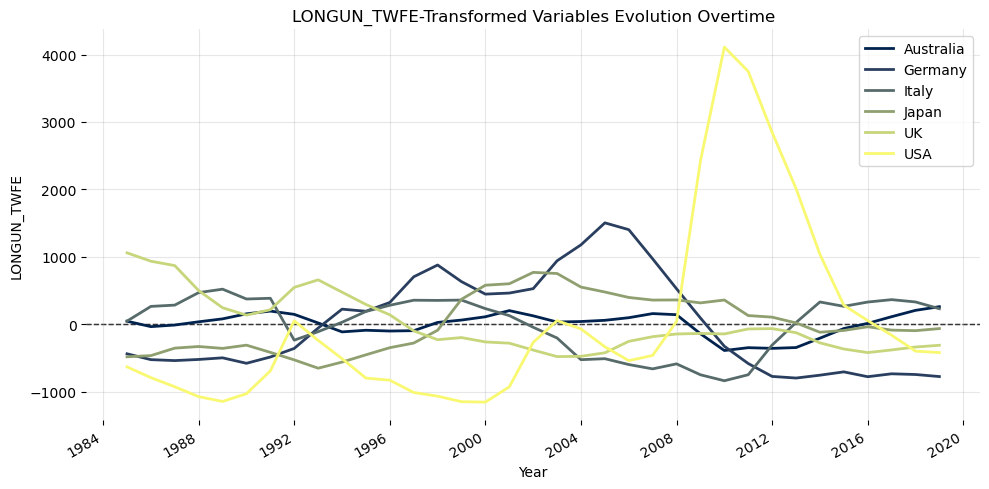

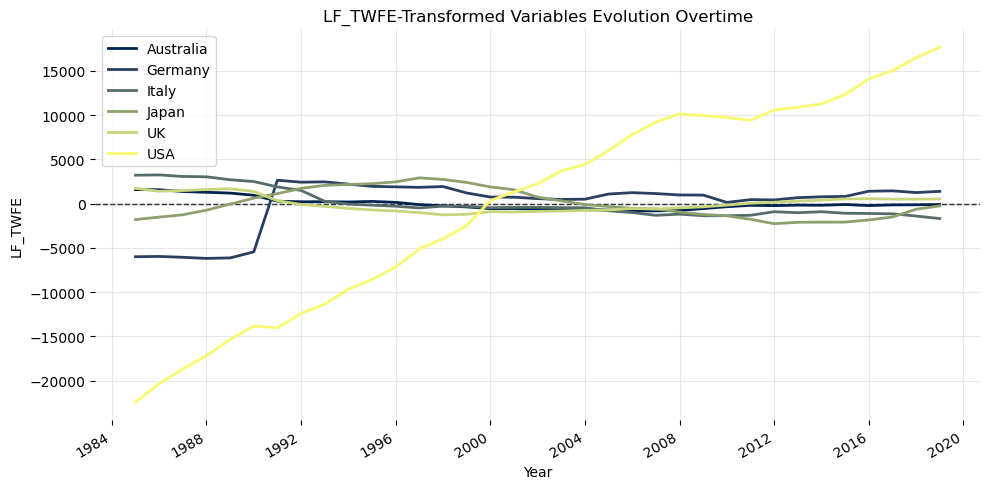

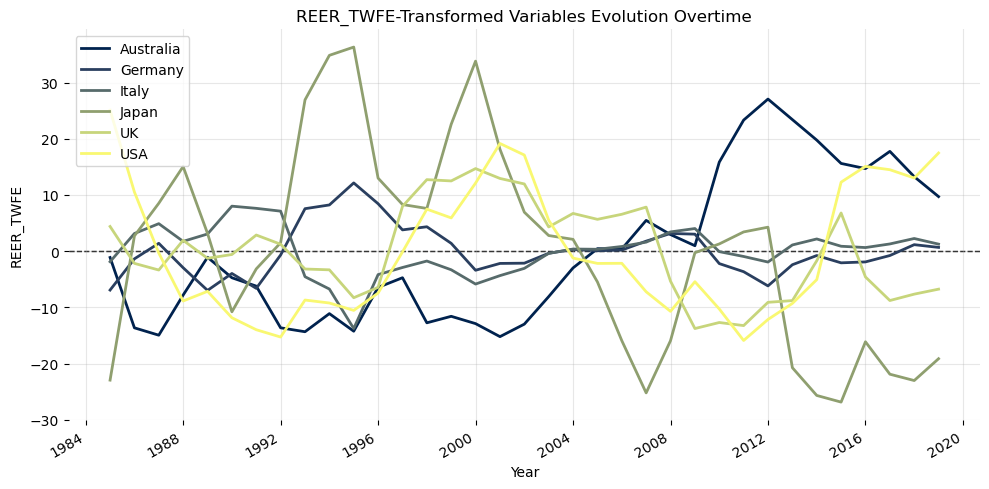

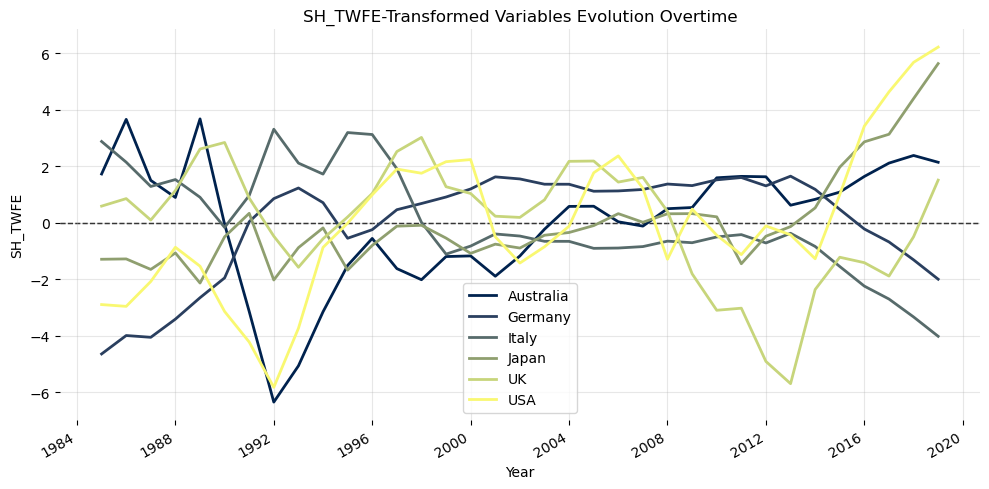

In [184]:
# TWFE-Transformed Variables - Over time plotting 

# //////
# Set-up
# //////
# Target countries and variables
target_countries = ["Australia", "Germany", "Italy", "Japan", "UK", "USA"]
target_variables = ["i_TWFE", "P_TWFE", "W_TWFE", "WR_TWFE", "GDP_TWFE", "LS_TWFE", "PCOM_TWFE", "UN_TWFE",
       "SHORTUN_TWFE", "LONGUN_TWFE", "LF_TWFE", "REER_TWFE", "SH_TWFE"]
# Country color mapping 
country_colors = {
    "Australia": "#00224e",
    "Germany":   "#2a3f5f",
    "Italy":     "#576b6b",
    "Japan":     "#8f9f6f",
    "UK":        "#c7d57b",
    "USA":       "#f9f871",
}


#/////////
# Plotting
#/////////
# Loop on variable (without country and time)
for var in target_variables: 
# (!!!) nice way to exclude country (index not var)
    if var == "country":
        continue
# Plot set-up
    fig, ax = plt.subplots(figsize=(10, 5))
# Loop on country
# (!!!) Check countries naming
    for country in target_countries: 
        df = TWFE_balanced_df[TWFE_balanced_df["country"].str.contains(country, na=False)]
        df = df[["country", var]]
        ax.plot(
            df.index,
            df[var],
            label=country,
            linewidth=2,
            color = country_colors.get(country)
        )
        
# 0 line
    ax.axhline(
    y=0,
    color="black",
    linewidth=1,
    linestyle="--",
    zorder=0
    )
    
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.set_title(f"{var}-Transformed Variables Evolution Overtime")
    ax.set_xlabel("Year")
    ax.set_ylabel(f"{var}")
    ax.grid(True, alpha=0.3)
    ax.legend()

    fig.autofmt_xdate()

    plt.tight_layout()
    plt.show()

##### <span style="color: dodgerblue"> **1.10) TWFE Balanced panel. Compute descriptive statistics. Plot boxplots by country ordered by their variance from the smallest to the largest.** </span>

In [185]:
# TWFE Balanced Panel - General outlook on descriptive statistic
# Count, mean, std, min, max, intra-quartiles (25th, 50th, 75th) + Skewness, Kurtosis

target_variables = ["i_TWFE", "P_TWFE", "W_TWFE", "WR_TWFE", "GDP_TWFE", "LS_TWFE", "PCOM_TWFE", "UN_TWFE",
       "SHORTUN_TWFE", "LONGUN_TWFE", "LF_TWFE", "REER_TWFE", "SH_TWFE"]

df = TWFE_balanced_df[target_variables]                
TWFE_balanced_desc_df = df.describe().T                         

TWFE_balanced_desc_df["skewness"] = df.skew()                    
TWFE_balanced_desc_df["kurtosis"] = df.kurtosis()                

TWFE_balanced_desc_df

,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis
i_TWFE,525.0,-6.564061e-16,1.592294e+00,-5.675480e+00,-0.980165,0.019301,0.820402,9.176744e+00,0.425101,2.926973
P_TWFE,525.0,-1.082732e-15,4.859661e+00,-2.032286e+01,-1.993333,-0.265714,2.267619,2.008381e+01,-0.410724,4.389100
W_TWFE,525.0,4.588076e-15,2.596300e+00,-9.070499e+00,-1.370734,-0.002971,1.755242,7.963376e+00,-0.116335,0.619497
WR_TWFE,525.0,-1.353415e-17,3.980828e+00,-9.342680e+00,-2.681973,-0.267027,2.500731,1.613817e+01,0.529132,0.829201
GDP_TWFE,525.0,9.180180e-11,8.224385e+05,-4.812937e+06,-193507.444989,4124.152583,164874.100526,5.226746e+06,-0.102560,17.711432
LS_TWFE,525.0,-6.090366e-16,1.814729e+00,-4.705714e+00,-1.205714,0.003810,1.201905,6.472381e+00,0.097647,0.020783
PCOM_TWFE,525.0,-2.030122e-16,1.184883e-15,-7.105427e-15,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000
UN_TWFE,525.0,-3.518878e-16,2.044162e+00,-7.896917e+00,-1.170767,0.016264,1.126981,7.192762e+00,-0.051427,1.660732
SHORTUN_TWFE,510.0,-1.640657e-13,2.975267e+02,-1.528696e+03,-104.345553,-0.853310,84.140430,2.962624e+03,1.919212,24.880154
LONGUN_TWFE,510.0,1.783323e-15,4.973307e+02,-1.234904e+03,-229.069785,16.074562,150.239678,4.111482e+03,2.671401,18.635548


In [189]:
# TWFE Balanced Panel - General outlook on descriptive statistic per country 
# Count, mean, std, min, max, intra-quartiles (25th, 50th, 75th) + Skewness, Kurtosis

target_variables = ["i_TWFE", "P_TWFE", "W_TWFE", "WR_TWFE", "GDP_TWFE", "LS_TWFE", "PCOM_TWFE", "UN_TWFE",
       "SHORTUN_TWFE", "LONGUN_TWFE", "LF_TWFE", "REER_TWFE", "SH_TWFE"]

for var in target_variables:
    print(f"\n===== {var} Balanced Panel - Descriptive Stats =====\n")

    g = TWFE_balanced_df.groupby("country")[var]
    table = g.describe()
    table["skewness"] = g.apply(lambda x: x.skew())
    table["kurtosis"] = g.apply(lambda x: x.kurtosis())

    print(table)


===== i_TWFE Balanced Panel - Descriptive Stats =====

             count          mean       std       min       25%       50%  \
country                                                                    
Australia     35.0 -8.881784e-16  1.958923 -5.675480 -0.750726  0.122748   
Belgium       35.0 -8.881784e-17  0.844116 -1.725816 -0.316174  0.353817   
Canada        35.0 -9.769963e-16  1.129697 -3.371345 -0.620652  0.284349   
Finland       35.0 -2.283887e-16  1.091747 -1.496900 -0.555367 -0.389942   
France        35.0 -1.268826e-15  0.659671 -1.839409 -0.270763  0.168552   
Germany       35.0 -6.597897e-16  1.784203 -4.842756  0.054410  0.843282   
Italy         35.0 -7.866723e-16  1.495409 -1.426504 -1.113693 -0.835235   
Japan         35.0 -6.851662e-16  1.845100 -2.826063 -1.492942 -0.467789   
Netherlands   35.0 -8.628019e-16  1.502573 -4.018851 -0.007102  0.716579   
Norway        35.0 -5.075305e-16  1.490154 -2.253624 -1.303105 -0.061894   
Portugal      35.0 -5.836601e-16

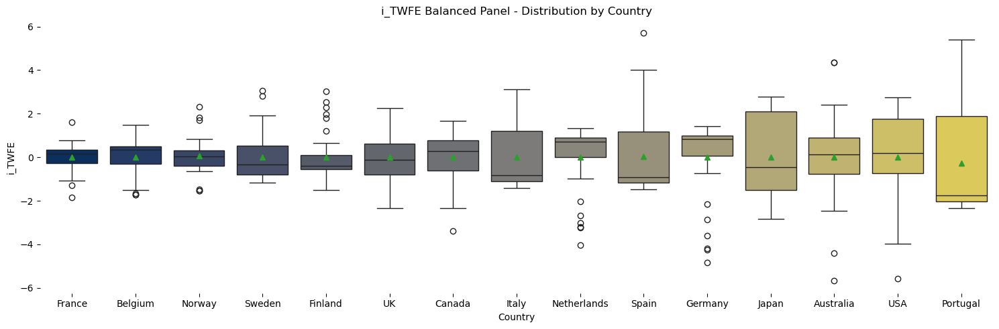

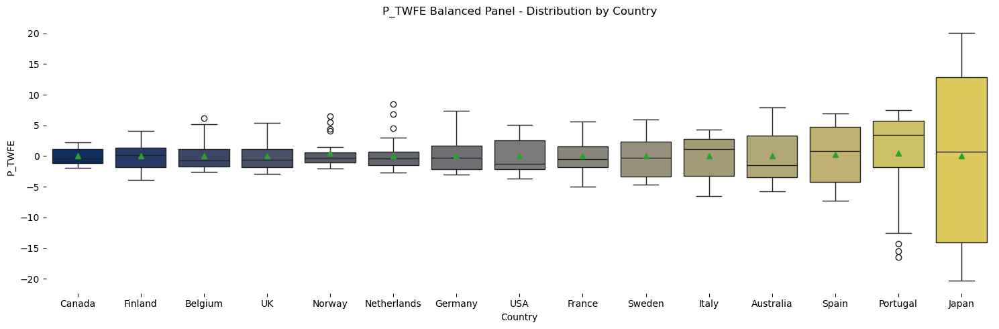

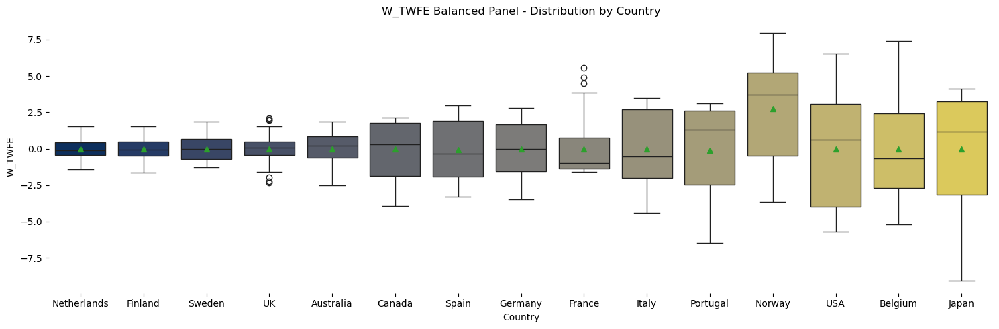

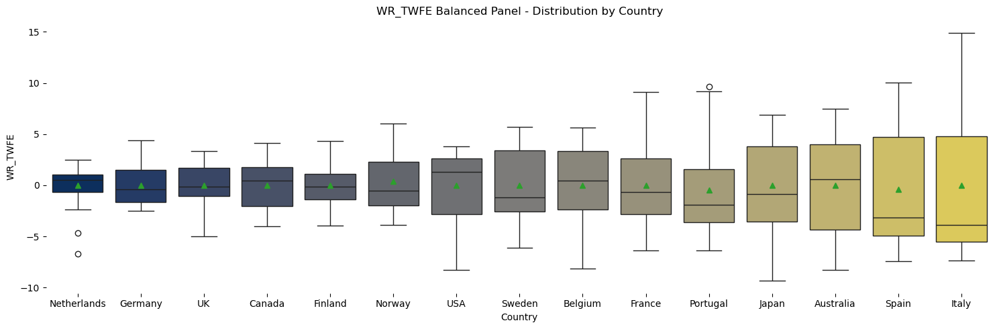

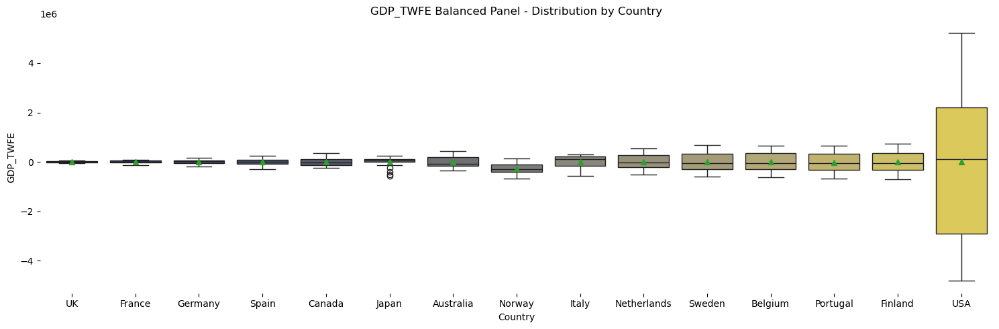

...

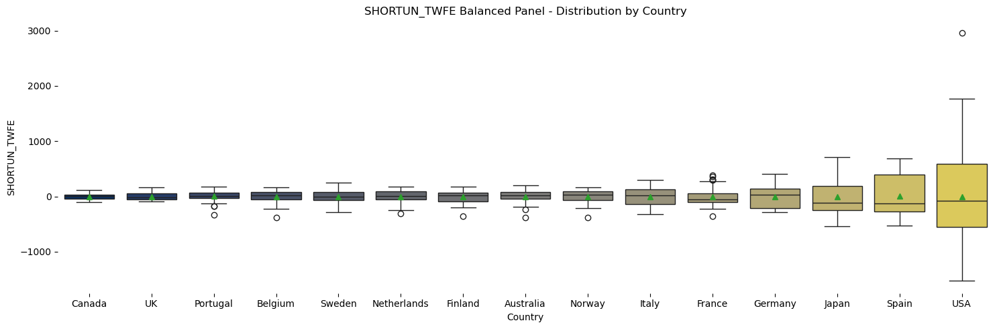

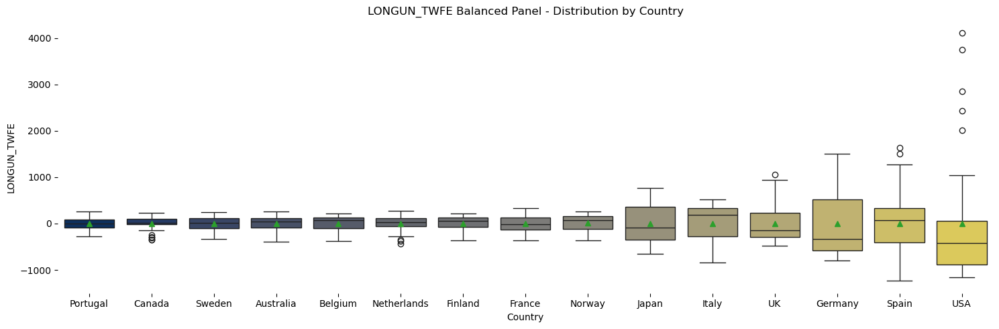

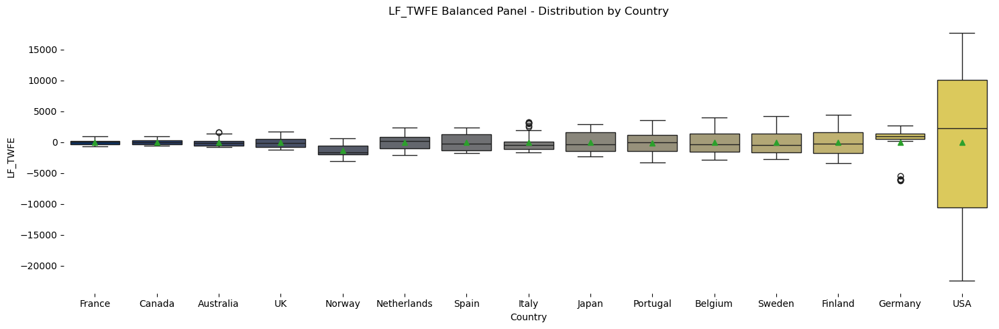

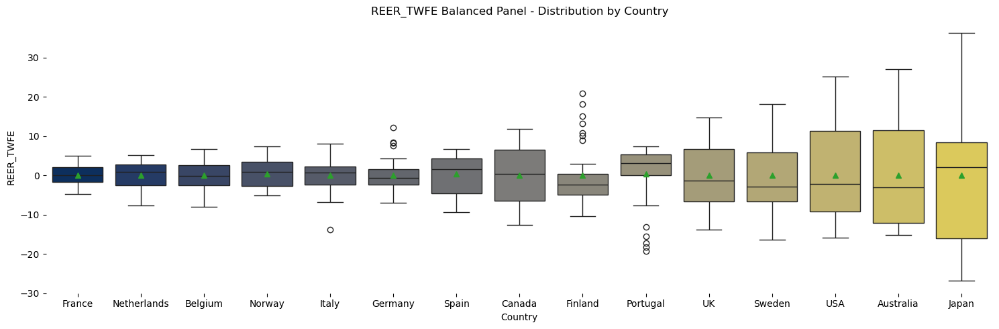

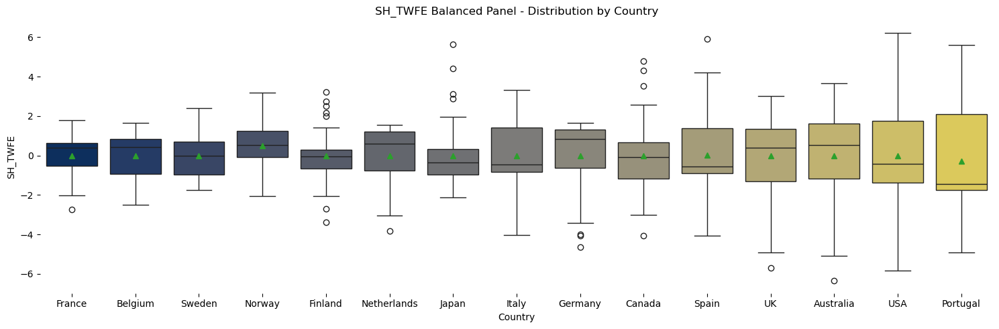

In [ ]:
# TWFE Balanced Panel - Classic Variable Boxplot
# (!!!) within country and overall mean equal to zero (verified)
target_variables = ["i_TWFE", "P_TWFE", "W_TWFE", "WR_TWFE", "GDP_TWFE", "LS_TWFE", "PCOM_TWFE", "UN_TWFE",
       "SHORTUN_TWFE", "LONGUN_TWFE", "LF_TWFE", "REER_TWFE", "SH_TWFE"]

#/////////
# Plotting
#/////////
# Loop on variable (without country and time)
for var in target_variables: 
# (!!!) nice way to exclude country (index not var)
    if var == "country":
        continue
# (!!!) NaN cleaning
    df = TWFE_balanced_df.copy().dropna()
    df = df[["country", var]]
# We wanto to order countries by variance to be plugged in sns under the call "order"
# (!!!) DO not call it stats or it will clashes with the library scipy.stats
    statistics = (
        df.groupby("country")[var]
        .agg(var="var", n="count")
        .dropna(subset=["var"])
    )
    statistics = statistics[statistics["n"] >= 2]
    if statistics.empty:
        continue
# (!!!) This is essential cuz the order must be unique (no more than one country can be associated to the same index number)
    country_order = statistics.sort_values("var").index
    country_order = pd.Index(country_order).unique().tolist()
# We define the palette following past graphs design
    pal = sns.color_palette("cividis", n_colors=len(country_order))

# Plot set-up
    fig, ax = plt.subplots(figsize=(15, 5))
    
    sns.boxplot(
        data=df,
        x="country",
        y=var,
        showmeans=True,
        order=country_order,
        ax=ax,
        palette=pal
    )
    
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.set_title(f"{var} Balanced Panel - Distribution by Country")
    ax.set_xlabel("Country")
    ax.set_ylabel(var)

    plt.tight_layout()
    plt.show()

##### <span style="color: dodgerblue"> **1.11) TWFE Balanced panel. Present a table ordering the simple correlation coefficients of TWFE transformed GDPG and EDA/GDP by country from the largest positive to the lowest negative, with the standard error of GDPG and EDA in another column and the coefficient of simple regression: correlation coefficient * standard error of GDPG / standard error of EDA/GDP. Comment.** </span>

In [ ]:
# TWFE Balanced Panel - Correlation Analysis
# Target/preferred variables in the state space vector of the PVAR model: i (TWFE-transformed) and GDP (TWFE-transformed)
df = TWFE_balanced_df[["country", "GDP_TWFE", "i_TWFE"]].dropna().copy()
rows = []

# We loop over country
# (!!!) It is essential to specify also the group in the loop as otherwise it would always compute all stats on the full dataset and not on the specific country group
for country, group in df.groupby("country"):
# Simple correlation coefficient
    corr = group["GDP_TWFE"].corr(group["i_TWFE"])
# Standard deviation for i and GDP (TWFE transformed)
    sd_gdp = group["GDP_TWFE"].std()
    sd_i = group["i_TWFE"].std()
# Simple regression coefficient (beta)
# (!!!) beta_i(i,GDP) = corr_i(i,GDP) * (sd_i_gdp / sd_i_i)
    beta = corr * (sd_gdp / sd_i)
    rows.append({
        "country": country,
        "corr(GDP_TWFE, i_TWFE)": corr,
        "sd(GDP_TWFE)": sd_gdp,
        "sd(i_TWFE)": sd_i,
        "Beta (simple regression coeff.)": beta
    })

# Unique table (concatenate)
corr_table = (
    pd.DataFrame(rows)
      .sort_values("corr(GDP_TWFE, i_TWFE)", ascending=False)
      .reset_index(drop=True)
)

corr_table

,country,"corr(GDP_TWFE, i_TWFE)",sd(GDP_TWFE),sd(i_TWFE),Beta (simple regression coeff.)
0,Portugal,0.830801,4.156073e+05,2.940217,117435.904659
1,Italy,0.699179,2.779910e+05,1.495409,129974.724418
2,Spain,0.678083,1.659170e+05,1.735230,64836.109723
3,USA,0.652655,3.049301e+06,2.082907,955463.374847
4,Sweden,0.647841,3.775601e+05,1.062518,230206.970104
5,Germany,0.647368,9.387544e+04,1.784203,34061.102732
6,Finland,0.597240,4.202729e+05,1.091747,229910.008070
7,UK,0.260867,3.073272e+04,1.093681,7330.446494
8,Japan,0.207224,1.824941e+05,1.845100,20496.022671
9,Norway,0.182648,4.054590e+05,1.490154,49697.036949


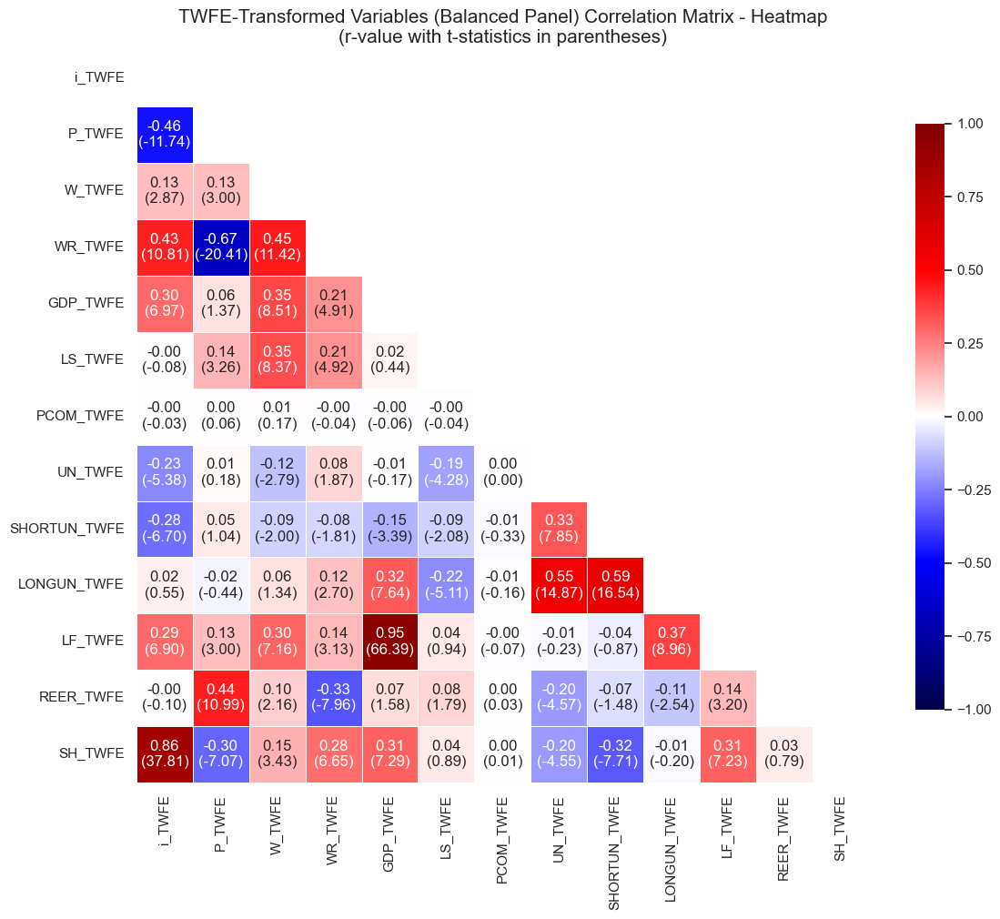

In [195]:
# TWFE Balanced Panel - Correlation Heatmap

df = TWFE_balanced_df[["i_TWFE", "P_TWFE", "W_TWFE", "WR_TWFE", "GDP_TWFE", "LS_TWFE", "PCOM_TWFE", "UN_TWFE",
       "SHORTUN_TWFE", "LONGUN_TWFE", "LF_TWFE", "REER_TWFE", "SH_TWFE"]].dropna().copy()

# ////////
# Plotting
# ////////
# Correlation matrix
corr_matrix = df.corr()
# Sample size
n = df.shape[0]

# t-statistics derived from correlation values
with np.errstate(divide="ignore", invalid="ignore"):
    t_stat_matrix = corr_matrix * np.sqrt((n - 2) / (1 - corr_matrix**2))
    t_stat_matrix = t_stat_matrix.round(2)

# For each cell, we want to have both the correlation index, as well as the just computed t-statistics
annot_matrix = corr_matrix.copy().astype(str)

for i in range(len(corr_matrix)):
    for j in range(len(corr_matrix)):
# We only want to keep the lower triangle and diagonal of the full correlation matrix
        if i >= j: 
            r = corr_matrix.iloc[i, j]
            t = t_stat_matrix.iloc[i, j]
            annot_matrix.iloc[i, j] = f"{r:.2f}\n({t:.2f})"
        else:
            annot_matrix.iloc[i, j] = ""

# We manually hide the upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Heat-map plot
# General Layout (figure's size and style)
plt.figure(figsize=(12, 10))
sns.set(style="white")

sns.heatmap(corr_matrix,
            mask=mask,
            annot=annot_matrix,
            fmt="",               
            cmap="seismic",          
            vmin=-1, vmax=1,       
            square=True,
            linewidths=0.5,
            cbar_kws={"shrink": .8})


plt.title("TWFE-Transformed Variables (Balanced Panel) Correlation Matrix - Heatmap\n(r-value with t-statistics in parentheses)", 
          fontsize=15)
plt.tight_layout()
plt.show()

##### <span style="color: dodgerblue"> **1.12) UNBALANCED PANEL and TWFE transformation (remove countries with a single observation). Regress within transformed GDPG on time dummies and collect the residuals: this is the TWFE transformation. Regress within transformed EDA/GDP on time dummies and collect the residuals: this is the TWFE transformation. Alternatively, code the Wansbeek Kapstein (1989) transformation for two way fixed effects resulting in their equation 2.13 which is an extension of x(it)-x(i.)-x(.t)+x(..) obtained in the balanced panel case.** </span>

In [ ]:
# Unbalanced Panel TWFE
# (!!!) No balancing (no balanced_raw_df)
# x_it - x_i. - x_.t + x_.. does not work for unbalanced panels (removing one mean (either i. or .t) re-introduces part of the other)
# (!!!) For an unbalanced panel, the "balanced" demeaning does not, in general, fully project out both sets of fixed effects because the two dummy subspaces (unit FE and time FE) don’t "line up" the same way as in a balanced grid.
# (!!!)Unbalanced panel issue: some countries enter late, some exit early, some years have many observations, others few. What if Country A only exists in good years and Country B only exists in bad years?

df = raw_df.copy()
target_variables = ["i", "P", "W", "WR", "GDP", "LS", "PCOM", "UN",
       "SHORTUN", "LONGUN", "LF", "REER", "SH"]
# Time dummy (D_year), outside the loop for reg 
T = pd.get_dummies(df["year"], drop_first=False)

# //////////////////////////////////////
# TWFE Transformation (unbalanced panel)
# //////////////////////////////////////

# Variables loop
# (!!!) We could just take past transformations of the whole dataset, but better to redo for sanity check (within transformation)
for var in target_variables: 
    df[f"{var}_within"] = df[var] - df.groupby("country")[var].transform("mean")

# ////////////////////    
# Residuals Collection
# ////////////////////
# (!!!) As variables may have different lenght, we need to ensure we have no NaN in the column/country group or it will cause the reg to crash
    mask = df[f"{var}_within"].notna() & df["year"].notna()
# y and x definition
    y = df.loc[mask, f"{var}_within"]
    X = T.loc[mask]  
# Regression (OLS)
# (!!!) No intercept so dummies span time effects fully
    reg = sm.OLS(y, X).fit()
# Residuals
    df[f"{var}_TWFE"] = np.nan
    df.loc[mask, f"{var}_TWFE"] = reg.resid
# We also drop temporary columns like within transformed variables or the original raw_df columns
    df = df.drop(columns=[f"{var}_within"])

# From the final df we also drop original raw_df columns (target_variables)
TWFE_unbalanced_df = df.copy()
TWFE_unbalanced_df = TWFE_unbalanced_df.drop(columns=target_variables)
# We set year as time index
TWFE_unbalanced_df = TWFE_unbalanced_df.set_index("year")

TWFE_unbalanced_df

,country,i_TWFE,P_TWFE,W_TWFE,WR_TWFE,GDP_TWFE,LS_TWFE,PCOM_TWFE,UN_TWFE,SHORTUN_TWFE,LONGUN_TWFE,LF_TWFE,REER_TWFE,SH_TWFE
year,,,,,,,,,,,,,,
1970-01-01,Australia,-2.066799,1.875733,0.623646,6.652899,6.417193e+05,-1.599571,1.421085e-14,0.083200,NaN,NaN,3746.924114,2.873095,-2.544304
1971-01-01,Australia,-0.579541,1.522400,0.623193,6.815177,6.194218e+05,-1.535286,2.131628e-14,-0.010331,NaN,NaN,3673.600806,5.056312,-1.057045
1972-01-01,Australia,-1.808769,1.215733,0.475336,5.360967,5.765079e+05,-1.728143,0.000000e+00,0.306079,NaN,NaN,3516.775114,4.881667,-2.286273
1973-01-01,Australia,-2.485405,0.742400,0.567227,0.878244,5.265239e+05,-0.949571,0.000000e+00,0.280121,NaN,NaN,3252.168575,15.521260,-2.962910
1974-01-01,Australia,0.953746,0.155733,1.184019,2.643711,5.213183e+05,3.743286,1.421085e-14,0.703663,NaN,NaN,2769.733122,17.166315,0.476242
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-01-01,USA,0.801977,2.097733,6.963959,9.355536,5.625355e+06,0.469433,0.000000e+00,-2.158072,-366.715087,510.316135,23419.420004,12.133839,1.115529
2016-01-01,USA,1.393459,2.517733,6.164488,8.342223,5.882897e+06,0.702767,1.776357e-15,-2.012960,-557.504449,282.317657,25183.856004,14.946635,3.544706
2017-01-01,USA,1.924043,3.037733,7.060389,8.851479,6.232285e+06,1.196100,-1.065814e-14,-1.792373,-943.479016,65.509990,26116.245337,14.351430,4.758716


In [ ]:
# Wansbeek–Kapteyn (1989) - TWFE Transformation (unbalanced panel)
# (!!!) Wansbeek–Kapteyn (1989) essentially say: in the unbalanced case you need the true projection onto the orthogonal complement of the span of the two dummy sets 
# (!!!) That’s a projection-matrix object, and the practical way to compute it (without building huge matrices) is alternating projections/iterative demeaning
# (!!!) Alternating projections: Imagine sanding a wooden block: sand all country patterns off, that creates some year patterns, sand the year patterns off, that recreates tiny country patterns, repeat…
# (!!!) Eventually: there’s nothing left to sand, no country pattern no year pattern. What remains is the pure residual.
# if it works we will observe within and country and overal residual means reverting to zero (orthogonal residuals)

df = raw_df.copy()
target_variables = ["i", "P", "W", "WR", "GDP", "LS", "PCOM", "UN",
                    "SHORTUN", "LONGUN", "LF", "REER", "SH"]
# Number of iterations (how many times i subtract the mean)
max_iter = 200

# Variables loop
for var in target_variables:
# (!!!) As variables may have different lenght, we need to ensure we have no NaN in the column/country group or it will cause the reg to crash
# Necessary only on var and year column (country is always filled)
    mask = (df[var].notna() & df["year"].notna())
    idx = df.index[mask]
# Variables definition
    x_it = df.loc[idx, var].astype(float)
    x_ = x_it.mean()
# Remove overall mean to help mean conversion
    x_it = x_it - x_

# ///////////////////////////
# Wansbeek–Kapteyn iterations
# ///////////////////////////
# (!!!) We use _ as the loop will run 200 times (max_iter) and it is not a var to be recalled later
    for _ in range(max_iter):
        x_it_old = x_it.copy()
# Country effects (i) out
        x_it = x_it - x_it.groupby(df.loc[idx, "country"]).transform("mean")
# Year effects (t) out
        x_it = x_it - x_it.groupby(df.loc[idx, "year"]).transform("mean")

    df[f"{var}_TWFE"] = np.nan
    df.loc[idx, f"{var}_TWFE"] = x_it

TWFE_wk_unbalanced_df = df.copy()
TWFE_wk_unbalanced_df = TWFE_wk_unbalanced_df.drop(columns=target_variables)
TWFE_wk_unbalanced_df = TWFE_wk_unbalanced_df.set_index("year")

# (!!!) Exact same results as TWFE-transformed data (unbalanced panel) with time dummies
TWFE_wk_unbalanced_df

,country,i_TWFE,P_TWFE,W_TWFE,WR_TWFE,GDP_TWFE,LS_TWFE,PCOM_TWFE,UN_TWFE,SHORTUN_TWFE,LONGUN_TWFE,LF_TWFE,REER_TWFE,SH_TWFE
year,,,,,,,,,,,,,,
1970-01-01,Australia,-2.066799,1.875733,0.623646,6.652899,6.417193e+05,-1.599571,0.0,0.083200,NaN,NaN,3746.924114,2.873095,-2.544304
1971-01-01,Australia,-0.579541,1.522400,0.623193,6.815177,6.194218e+05,-1.535286,0.0,-0.010331,NaN,NaN,3673.600806,5.056312,-1.057045
1972-01-01,Australia,-1.808769,1.215733,0.475336,5.360967,5.765079e+05,-1.728143,0.0,0.306079,NaN,NaN,3516.775114,4.881667,-2.286273
1973-01-01,Australia,-2.485405,0.742400,0.567227,0.878244,5.265239e+05,-0.949571,0.0,0.280121,NaN,NaN,3252.168575,15.521260,-2.962910
1974-01-01,Australia,0.953746,0.155733,1.184019,2.643711,5.213183e+05,3.743286,0.0,0.676988,NaN,NaN,2727.023940,17.166315,0.476242
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-01-01,USA,0.801977,2.097733,6.619742,9.516221,5.625355e+06,0.555155,0.0,-2.214725,-517.230281,381.284598,23330.379430,12.133839,1.115529
2016-01-01,USA,1.393459,2.517733,5.820270,8.502908,5.882897e+06,0.788488,0.0,-2.069614,-708.019643,153.286121,25094.815430,14.946635,3.544706
2017-01-01,USA,1.924043,3.037733,6.716171,9.012164,6.232285e+06,1.281821,0.0,-1.849026,-1093.994209,-63.521546,26027.204763,14.351430,4.758716


##### <span style="color: dodgerblue"> **1.13) TWFE unbalanced panel: plot the distribution (Kernel DE, histogram, corresponding normal law with the same two first moments). for dependent GDPG and explanatory EDA/GDP. Compare with one-way-fixed effects, between distributions.** </span>

##### <span style="color: dodgerblue"> **1.14) Plot boxplots of between distribution (all countries), then one-way and two-way-fixed effects and first differences distribution BY countries (or 20 individuals if your data set has more than 20 individuals), for the dependent variable and the key explanatory variables. Comment that you find the same insights from question 5. Comment on their differences of standard errors and means for each individuals** </span>

##### <span style="color: dodgerblue"> **1.15) Compute univariate descriptive statistics (min, Q1, median, Q3, max, mean, standard error) for one-way-Within, Between, two-way-fixed-effects and first differences transformed variables. Is the mean different from the median and why? How many standard errors from the mean are the MIN and MAX extremes. Report in the tables standardized MAX and MIN: (MAX-average)/standard error and (MIN-average)/standard error instead of MAX and MIN?** </span>

##### <span style="color: dodgerblue"> **1.16) Compare and comment the between versus one-way-within transformed bivariate correlation matrix for all variables (include a time trend 1,2,.,T) and with their lag (for time varying variables). Check poor simple correlation with the dependent variables and high correlation between explanatory variables.** </span>

##### <span style="color: dodgerblue"> **1.17) Comment the bivariate auto-correlation and trend-correlations (check the number of observations).** </span>

[no code, comment in the document]

##### <span style="color: dodgerblue"> **1.18) In what follows, you do not need to include a deterministic time trend 1,2,.,T because the two transformations used eliminate it. Compare and comment of the two-way-within transformed bivariate simple correlation matrix of all the variables and another bivariate simple correlation matrix with all the first differences transformed variables (in the case of first differences, include also the lag of all variables). Check poor simple correlation below 0.1 with the dependent variables and high correlation between explanatory variables (over 0.8). Show the first 30 observations for the first differences and the lag of first differences. Check that each time you change individual, you have a dot for missing observation.** </span>

##### <span style="color: dodgerblue"> **1.19) Comment the bivariate graphs with linear, quadratic and Lowess fit for dependent and key explanatory variable (growth of gdp/head on vertical axis and aid/gdp): Within transformed, Between transformed, First differences, two-way-within transformed.** </span>

### **2) PART 2 - CLASSIC BENCHMARK MULTIVARIATE PANEL DATA ESTIMATORS**

##### <span style="color: orange"> **2.20) In a single table, report and comment the results of estimations of Between, Within (one-way fixed effects, (fe)) and Mundlak (random effects (re) including all X(i.) as regressors), two-way fixed effects (add year dummies in fe regression) and First differences, including all explanatory variables except the ones with high near-multicollinearity after their transformation.** </span>

##### <span style="color: orange"> **2.21) If, for the first differences dependent variable, it remains a simple auto-correlation above 0.1, a dynamic panel estimator can be tried. The estimators of the generalized method of moments (GMM) for panel data are only valid for short time panel T<10 and they face the issue of too many weak instruments. We suggest using its precursor, the Anderson-Hsiao (1981) estimator which allows to check the first stage of instrumental variables and to test for weak lagged instruments. Estimate an auto-regressive distributed lag (ARDL) model for dynamic panel data including the first lag of the dependent variable (for example: GDP per head growth) and the first lag of the key explanatory variable (for example: foreign aid/GDP), adding the first lag of other control variables is optional: Δ GDPGi,t = βy Δ GDPGi,t-1 + β1 Δ (aid/GDP)i,t + β2 Δ (aid/GDP)i,t-1 + Δ Controls i,t + Δ αi + Δ αt + Δ εi** </span>

!!! it has a lot of parts (check the paper)

### **2) PART 2B - OPTIONAL (if one of your variable is time-invariant z(i))**

##### <span style="color: orange"> **2.22) If one of your variable is time-invariant z(i), run a baseline Hausman Taylor estimation (pre-coded only in STATA) including all X(i.) as instruments. Comment the results. Else skip this question.** </span>

##### <span style="color: orange"> **2.23) If one of your variable is time-invariant z(i), run a between regression on z(i) explained by X(i.) and other time invariant variable (only with N observations). If the R2 is low, this may signal X(i.) are weak instruments poorly correlated with the variable z(i) to be instrumented. Comment. Else skip this question.** </span>

##### <span style="color: orange"> **2.24) If one of your variable is time-invariant z(i), as seen above, time invariant explanatory variables cannot explain the time varying within variance of the dependent variable and the Hausman Taylor internal instruments estimator is not so practical. Therefore, a practical shortcut is to include a time invariant variable multiplied by a time varying variable (interaction term): z(i) multiplied for x(it). Generate such a variable Include this product AND foreign aid into a one way fixed effects regression. Plot the estimated marginal effect (derivative) with respect to ICRG as a function of EDA/GDP (which is positive and goes as far as 20%).** </span>

### **3) PART 3 - OPEN SECTION**

##### <span style="color: red"> **3.25) Do whatever seem interesting to you in terms of original estimations (not already done by the replication of the original authors) with this database, present the table(s) in this file with comments, not only in the html output with code and output.** </span>